In [1]:
!pip install keras-nightly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 11.2 MB/s eta 0:00:00


In [2]:
!pip install tensorflow

In [1]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import math
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds

import keras
from keras import layers
from keras import ops

In [9]:
# data
dataset_name = "ddim"
dataset_repetitions = 5
num_epochs = 50  # train for at least 50 epochs for good results
image_size = 64
# KID = Kernel Inception Distance, see related section
kid_image_size = 75
kid_diffusion_steps = 5
plot_diffusion_steps = 20

# sampling
min_signal_rate = 0.02
max_signal_rate = 0.95

# architecture
embedding_dims = 32
embedding_max_frequency = 1000.0
widths = [32, 64, 96, 128]
block_depth = 2

# optimization
batch_size = 32
ema = 0.999
learning_rate = 1e-3
weight_decay = 1e-4

In [10]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
import os
import cv2
import tensorflow as tf
from tensorflow.python.ops import math_ops as ops  # Importing ops from tensorflow


In [12]:
folder_path = '/content/drive/MyDrive/ddim_images/training'

# Load Images and Extract Labels
image_list = []
labels = []

for filename in os.listdir(folder_path):
    if filename.endswith(".JPEG") or filename.endswith(".png"):
        img = cv2.imread(os.path.join(folder_path, filename))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
            label = os.path.splitext(filename)[0]  # Assuming the label is the file name without extension
            labels.append(label)
            image_list.append(img)


In [13]:
dataset = tf.data.Dataset.from_tensor_slices(image_list)


KeyboardInterrupt: 

In [14]:
def preprocess_image(image):
    # Convert the image to a TensorFlow tensor
    image = tf.image.convert_image_dtype(image, tf.float32)

    # Center crop and resize the image
    height = tf.shape(image)[0]
    width = tf.shape(image)[1]
    crop_size = tf.minimum(height, width)
    image = tf.image.crop_to_bounding_box(
        image,
        (height - crop_size) // 2,
        (width - crop_size) // 2,
        crop_size,
        crop_size,
    )
    image = tf.image.resize(image, [image_size, image_size], method=tf.image.ResizeMethod.AREA, antialias=True)

    # Normalize the image
    image = tf.clip_by_value(image / 255.0, 0.0, 1.0)

    return image

In [15]:
# Apply preprocessing function to the dataset
train_dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)\
                        .cache()\
                        .repeat(dataset_repetitions)\
                        .shuffle(10 * batch_size)\
                        .batch(batch_size, drop_remainder=True)\
                        .prefetch(buffer_size=tf.data.AUTOTUNE)

In [16]:
print(batch_size)

32


In [17]:
import tensorflow as tf

# Take a specified number of elements from the dataset for previewing their shapes
# For example, to preview the shapes of the first 5 images:
for image in train_dataset:
    # Print the shape of the image tensor
    print(image.shape)

(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64,

In [18]:

from PIL import Image
import numpy as np

In [18]:
import os


source_directory = '/content/drive/MyDrive/ddim_images/sub-01'

# Set the path to the new directory for saving modified filenames
destination_directory = '/content/drive/MyDrive/ddim_images/sub-01_modified'

In [20]:

# Ensure the destination directory exists, create it if not
os.makedirs(destination_directory, exist_ok=True)

file_list = os.listdir(source_directory)

# Iterate through each file, remove the "image-" part, and save to the destination directory
for filename in file_list:
    if filename.startswith("image-") and filename.endswith(".tif"):
        new_filename = filename.replace("image-", "")
        source_path = os.path.join(source_directory, filename)
        destination_path = os.path.join(destination_directory, new_filename)
        os.rename(source_path, destination_path)

# Print a message indicating the completion of renaming
print("Files renamed and saved to the destination directory.")

Files renamed and saved to the destination directory.


In [19]:
test_path='/content/drive/MyDrive/ddim_images/sub-01_modified'

In [42]:
'''
from PIL import Image
import os

def convert_tif_to_jpeg(input_folder, output_folder):
    # Create output folder if it doesn't exist
    os.makedirs(output_folder, exist_ok=True)

    for filename in os.listdir(input_folder):
        if filename.endswith(".tif"):
            tif_path = os.path.join(input_folder, filename)
            jpeg_path = os.path.join(output_folder, os.path.splitext(filename)[0] + ".jpeg")

            # Open the TIFF image and save as JPEG
            with Image.open(tif_path) as tif_image:
                tif_image.save(jpeg_path, "JPEG")

# Specify the input and output folders
input_folder_path = '/content/drive/MyDrive/ddim_images/sub-01/'
output_folder_path = test_path

# Convert TIFF to JPEG
convert_tif_to_jpeg(input_folder_path, output_folder_path)
'''


In [21]:
test_image_list = []
test_labels = []

for filename in os.listdir(test_path):
    if filename.endswith(".tif") or filename.endswith(".png"):
        img_test = cv2.imread(os.path.join(test_path, filename))
        # Perform any additional preprocessing if needed

        # Extract label from the image name (assuming the image name is the label)
        label_test = os.path.splitext(filename)[0]  # remove file extension
        test_labels.append(label_test)
        test_image_list.append(img_test)



In [25]:
len(test_image_list)

50

In [22]:
dataset_test = tf.data.Dataset.from_tensor_slices(test_image_list)


In [23]:
# Apply preprocessing function to the dataset
test_dataset = dataset_test.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)\
                        .cache()\
                        .repeat(dataset_repetitions)\
                        .shuffle(10 * batch_size)\
                        .batch(batch_size, drop_remainder=True)\
                        .prefetch(buffer_size=tf.data.AUTOTUNE)

In [24]:
import tensorflow as tf

# Assuming test_dataset_images is a TensorFlow Dataset object containing only the images

# Iterate through the dataset and print the shape of each image
for image in test_dataset:  # Adjust the number inside take() as needed
    # Print the shape of the image tensor
    print(image.shape)


(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)
(32, 64, 64, 3)


In [26]:

@keras.saving.register_keras_serializable()
class KID(keras.metrics.Metric):
    def __init__(self, name, **kwargs):
        super().__init__(name=name, **kwargs)

        # KID is estimated per batch and is averaged across batches
        self.kid_tracker = keras.metrics.Mean(name="kid_tracker")

        # a pretrained InceptionV3 is used without its classification layer
        # transform the pixel values to the 0-255 range, then use the same
        # preprocessing as during pretraining
        self.encoder = keras.Sequential(
            [
                keras.Input(shape=(image_size, image_size, 3)),
                layers.Rescaling(255.0),
                layers.Resizing(height=kid_image_size, width=kid_image_size),
                layers.Lambda(keras.applications.inception_v3.preprocess_input),
                keras.applications.InceptionV3(
                    include_top=False,
                    input_shape=(kid_image_size, kid_image_size, 3),
                    weights="imagenet",
                ),
                layers.GlobalAveragePooling2D(),
            ],
            name="inception_encoder",
        )

    def polynomial_kernel(self, features_1, features_2):
        feature_dimensions = tf.cast(tf.shape(features_1)[1], dtype=tf.float32)
        return (
            tf.matmul(features_1, tf.transpose(features_2)) / feature_dimensions + 1.0
          ) ** 3.0

    def update_state(self, real_images, generated_images, sample_weight=None):
        real_features = self.encoder(real_images, training=False)
        generated_features = self.encoder(generated_images, training=False)

        # compute polynomial kernels using the two sets of features
        kernel_real = self.polynomial_kernel(real_features, real_features)
        kernel_generated = self.polynomial_kernel(
            generated_features, generated_features
        )
        kernel_cross = self.polynomial_kernel(real_features, generated_features)

        # estimate the squared maximum mean discrepancy using the average kernel values
        batch_size = real_features.shape[0]
        batch_size_f = tf.cast(batch_size, dtype=tf.float32)
        mean_kernel_real = tf.reduce_sum(kernel_real * (1.0 - tf.eye(batch_size))) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_generated = tf.reduce_sum(kernel_generated * (1.0 - tf.eye(batch_size))) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_cross = tf.reduce_mean(kernel_cross)
        kid = mean_kernel_real + mean_kernel_generated - 2.0 * mean_kernel_cross
        # update the average KID estimate
        self.kid_tracker.update_state(kid)

    def result(self):
        return self.kid_tracker.result()

    def reset_state(self):
        self.kid_tracker.reset_state()


In [27]:

@keras.saving.register_keras_serializable()
def sinusoidal_embedding(x):
    embedding_min_frequency = 1.0
    frequencies = tf.exp(
        tf.linspace(
            tf.math.log(embedding_min_frequency),
            tf.math.log(embedding_max_frequency),
            embedding_dims // 2,
        )
    )
    angular_speeds = tf.cast(2.0 * math.pi * frequencies, "float32")
    embeddings = tf.concat(
        [tf.math.sin(angular_speeds * x), tf.cos(angular_speeds * x)], axis=3
    )
    return embeddings


def ResidualBlock(width):
    def apply(x):
        input_width = x.shape[3]
        if input_width == width:
            residual = x
        else:
            residual = layers.Conv2D(width, kernel_size=1)(x)
        x = layers.BatchNormalization(center=False, scale=False)(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same", activation="swish")(x)
        x = layers.Conv2D(width, kernel_size=3, padding="same")(x)
        x = layers.Add()([x, residual])
        return x

    return apply


def DownBlock(width, block_depth):
    def apply(x):
        x, skips = x
        for _ in range(block_depth):
            x = ResidualBlock(width)(x)
            skips.append(x)
        x = layers.AveragePooling2D(pool_size=2)(x)
        return x

    return apply


def UpBlock(width, block_depth):
    def apply(x):
        x, skips = x
        x = layers.UpSampling2D(size=2, interpolation="bilinear")(x)
        for _ in range(block_depth):
            x = layers.Concatenate()([x, skips.pop()])
            x = ResidualBlock(width)(x)
        return x

    return apply


def get_network(image_size, widths, block_depth):
    noisy_images = keras.Input(shape=(image_size, image_size, 3))
    noise_variances = keras.Input(shape=(1, 1, 1))

    e = layers.Lambda(sinusoidal_embedding, output_shape=(1, 1, 32))(noise_variances)
    e = layers.UpSampling2D(size=image_size, interpolation="nearest")(e)

    x = layers.Conv2D(widths[0], kernel_size=1)(noisy_images)
    x = layers.Concatenate()([x, e])

    skips = []
    for width in widths[:-1]:
        x = DownBlock(width, block_depth)([x, skips])

    for _ in range(block_depth):
        x = ResidualBlock(widths[-1])(x)

    for width in reversed(widths[:-1]):
        x = UpBlock(width, block_depth)([x, skips])

    x = layers.Conv2D(3, kernel_size=1, kernel_initializer="zeros")(x)

    return keras.Model([noisy_images, noise_variances], x, name="residual_unet")


In [28]:
@keras.saving.register_keras_serializable()
class KID(keras.metrics.Metric):
    def __init__(self, name, **kwargs):
        super().__init__(name=name, **kwargs)

        # KID is estimated per batch and is averaged across batches
        self.kid_tracker = keras.metrics.Mean(name="kid_tracker")

        # a pretrained InceptionV3 is used without its classification layer
        # transform the pixel values to the 0-255 range, then use the same
        # preprocessing as during pretraining
        self.encoder = keras.Sequential(
            [
                keras.Input(shape=(image_size, image_size, 3)),
                layers.Rescaling(255.0),
                layers.Resizing(height=kid_image_size, width=kid_image_size),
                layers.Lambda(keras.applications.inception_v3.preprocess_input),
                keras.applications.InceptionV3(
                    include_top=False,
                    input_shape=(kid_image_size, kid_image_size, 3),
                    weights="imagenet",
                ),
                layers.GlobalAveragePooling2D(),
            ],
            name="inception_encoder",
        )

    def polynomial_kernel(self, features_1, features_2):
        feature_dimensions = tf.cast(tf.shape(features_1)[1], dtype=tf.float32)
        return (tf.matmul(features_1, tf.transpose(features_2)) / feature_dimensions + 1.0) ** 3.0


    def update_state(self, real_images, generated_images, sample_weight=None):
        real_features = self.encoder(real_images, training=False)
        generated_features = self.encoder(generated_images, training=False)

        # compute polynomial kernels using the two sets of features
        kernel_real = self.polynomial_kernel(real_features, real_features)
        kernel_generated = self.polynomial_kernel(
            generated_features, generated_features
        )
        kernel_cross = self.polynomial_kernel(real_features, generated_features)

        # estimate the squared maximum mean discrepancy using the average kernel values
        batch_size = real_features.shape[0]
        batch_size_f = tf.cast(batch_size, dtype=tf.float32)
        mean_kernel_real = tf.reduce_sum(kernel_real * (1.0 - tf.eye(batch_size))) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_generated = tf.reduce_sum(kernel_generated * (1.0 - tf.eye(batch_size))) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_cross = tf.reduce_mean(kernel_cross)
        kid = mean_kernel_real + mean_kernel_generated - 2.0 * mean_kernel_cross


        # update the average KID estimate
        self.kid_tracker.update_state(kid)

    def result(self):
        return self.kid_tracker.result()

    def reset_state(self):
        self.kid_tracker.reset_state()


In [29]:

@keras.saving.register_keras_serializable()
class DiffusionModel(keras.Model):

    def __init__(self, image_size, widths, block_depth):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = get_network(image_size, widths, block_depth)
        self.ema_network = keras.models.clone_model(self.network)
        self.noise_loss_tracker = keras.metrics.Mean(name="n_loss")
        self.image_loss_tracker = keras.metrics.Mean(name="i_loss")
        self.kid = KID(name="kid")  # M

    def compile(self, **kwargs):
        super().compile(**kwargs)

        self.noise_loss_tracker = keras.metrics.Mean(name="n_loss")
        self.image_loss_tracker = keras.metrics.Mean(name="i_loss")
        self.kid = KID(name="kid")

    @property
    def metrics(self):
        return [self.noise_loss_tracker, self.image_loss_tracker, self.kid]

    def denormalize(self, images):
        # convert the pixel values back to 0-1 range
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return tf.clip_by_value(images, 0.0, 1.0)

    def diffusion_schedule(self, diffusion_times):
        # diffusion times -> angles
        start_angle = tf.cast(tf.math.acos(max_signal_rate), "float32")
        end_angle = tf.cast(tf.math.acos(min_signal_rate), "float32")

        diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

        # angles -> signal and noise rates
        signal_rates = tf.math.cos(diffusion_angles)
        noise_rates = tf.math.sin(diffusion_angles)
        # note that their squared sum is always: sin^2(x) + cos^2(x) = 1

        return noise_rates, signal_rates

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        # the exponential moving average weights are used at evaluation
        if training:
            network = self.network
        else:
            network = self.ema_network

        # predict noise component and calculate the image component using it
        pred_noises = network([noisy_images, noise_rates**2], training=training)
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        # reverse diffusion = sampling
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps

        # important line:
        # at the first sampling step, the "noisy image" is pure noise
        # but its signal rate is assumed to be nonzero (min_signal_rate)
        next_noisy_images = initial_noise
        for step in range(diffusion_steps):
            noisy_images = next_noisy_images

            # separate the current noisy image to its components
            diffusion_times = tf.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=False
            )
            # network used in eval mode

            # remix the predicted components using the next signal and noise rates
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            next_noisy_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
            # this new noisy image will be used in the next step

        return pred_images

    def generate(self, num_images, diffusion_steps):
        # noise -> images -> denormalized images
        initial_noise = keras.random.normal(
            shape=(num_images, image_size, image_size, 3)
        )
        generated_images = self.reverse_diffusion(initial_noise, diffusion_steps)
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=True)
        noises = keras.random.normal(shape=(batch_size, image_size, image_size, 3))

        # sample uniform random diffusion times
        diffusion_times = keras.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        # mix the images with noises accordingly
        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training
            image_loss = self.loss(images, pred_images)  # only used as metric

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.network.trainable_weights))

        self.noise_loss_tracker.update_state(noise_loss)
        self.image_loss_tracker.update_state(image_loss)

        # track the exponential moving averages of weights
        for weight, ema_weight in zip(self.network.weights, self.ema_network.weights):
            ema_weight.assign(ema * ema_weight + (1 - ema) * weight)

        # KID is not measured during the training phase for computational efficiency
        return {m.name: m.result() for m in self.metrics[:-1]}

    def test_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=False)
        noises = keras.random.normal(shape=(batch_size, image_size, image_size, 3), dtype=tf.float32)

        # sample uniform random diffusion times
        diffusion_times = keras.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        # mix the images with noises accordingly
        noisy_images = signal_rates * images + noise_rates * noises

        # use the network to separate noisy images to their components
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )

        noise_loss = self.loss(noises, pred_noises)
        image_loss = self.loss(images, pred_images)

        self.image_loss_tracker.update_state(image_loss)
        self.noise_loss_tracker.update_state(noise_loss)

        # measure KID between real and generated images
        # this is computationally demanding, kid_diffusion_steps has to be small
        images = self.denormalize(images)
        generated_images = self.generate(
            num_images=batch_size, diffusion_steps=kid_diffusion_steps
        )
        self.kid.update_state(images, generated_images)

        return {m.name: m.result() for m in self.metrics}

    def plot_images(self, epoch=None, logs=None, num_rows=3, num_cols=6):
        #print("hello")
        # plot random generated images for visual evaluation of generation quality
        generated_images = self.generate(
            num_images=num_rows * num_cols,
            diffusion_steps=plot_diffusion_steps,
        )

        plt.figure(figsize=(num_cols * 2.0, num_rows * 2.0))
        for row in range(num_rows):
            for col in range(num_cols):
                index = row * num_cols + col
                plt.subplot(num_rows, num_cols, index + 1)
                plt.imshow(generated_images[index])
                plt.axis("off")
        plt.tight_layout()
        plt.show()
        plt.close()




In [43]:
!pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 10.9 MB/s eta 0:00:00


In [64]:
tf.config.run_functions_eagerly(True)

In [31]:
# create and compile the model
model = DiffusionModel(image_size, widths, block_depth)
# below tensorflow 2.9:
# pip install tensorflow_addons
# import tensorflow_addons as tfa
# optimizer=tfa.optimizers.AdamW
model.compile(
    optimizer=keras.optimizers.AdamW(
        learning_rate=learning_rate, weight_decay=weight_decay
    ),
    loss=keras.losses.mean_absolute_error,
)
# pixelwise mean absolute error is used as loss

# save the best model based on the validation KID metric
checkpoint_path = "checkpoints/diffusion_model.weights.h5"
checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    monitor="val_kid",
    mode="min",
    save_best_only=True,
)

# calculate mean and variance of training dataset for normalization

model.normalizer.adapt(train_dataset)



In [32]:
model.summary()

Model: "diffusion_model_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ normalization_1 (Normalization)      │ ?                           │               7 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ residual_unet (Functional)           │ ?                           │       1,953,507 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ residual_unet (Functional)           │ ?                           │       1,953,507 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,907,021 (14.90 MB)

 Trainable params: 3,901,254 (14.88 MB)

 Non-trainable params: 5,767 (22.53 KB)

Epoch 1/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - i_loss: 1.0443 - n_loss: 0.3892

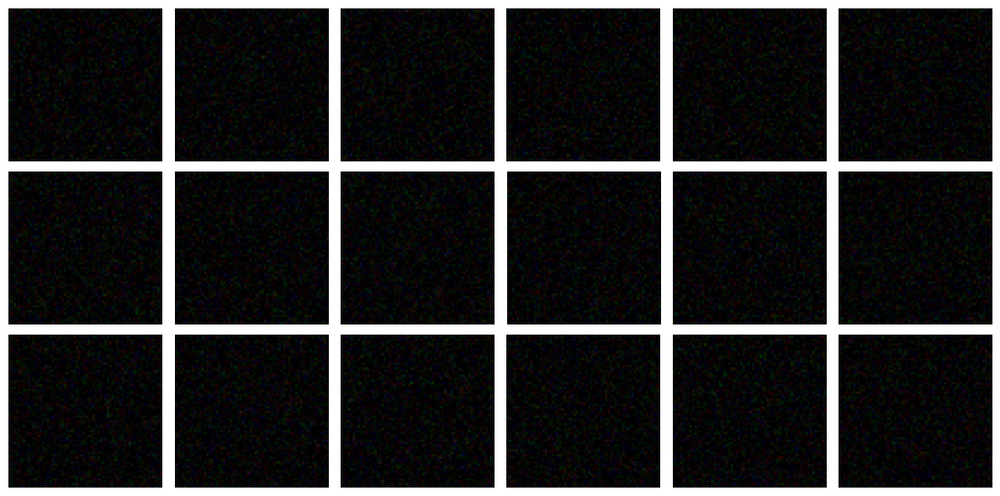

187/187 ━━━━━━━━━━━━━━━━━━━━ 122s 401ms/step - i_loss: 1.0421 - n_loss: 0.3886 - kid: 0.0000e+00 - val_i_loss: 2.2905 - val_kid: 3.3151 - val_n_loss: 0.7971
Epoch 2/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.3733 - n_loss: 0.1908

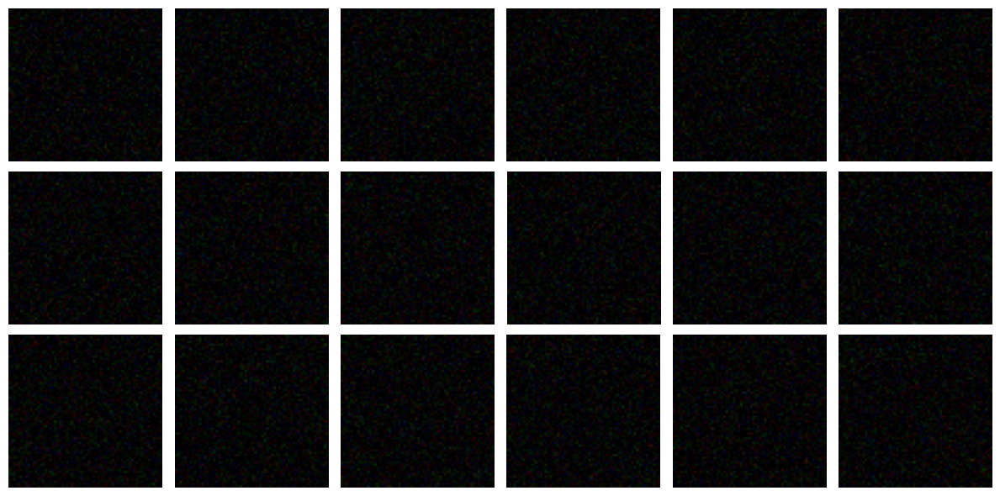

187/187 ━━━━━━━━━━━━━━━━━━━━ 57s 117ms/step - i_loss: 0.3732 - n_loss: 0.1908 - kid: 0.0000e+00 - val_i_loss: 2.5704 - val_kid: 3.3139 - val_n_loss: 0.7944
Epoch 3/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.3144 - n_loss: 0.1776

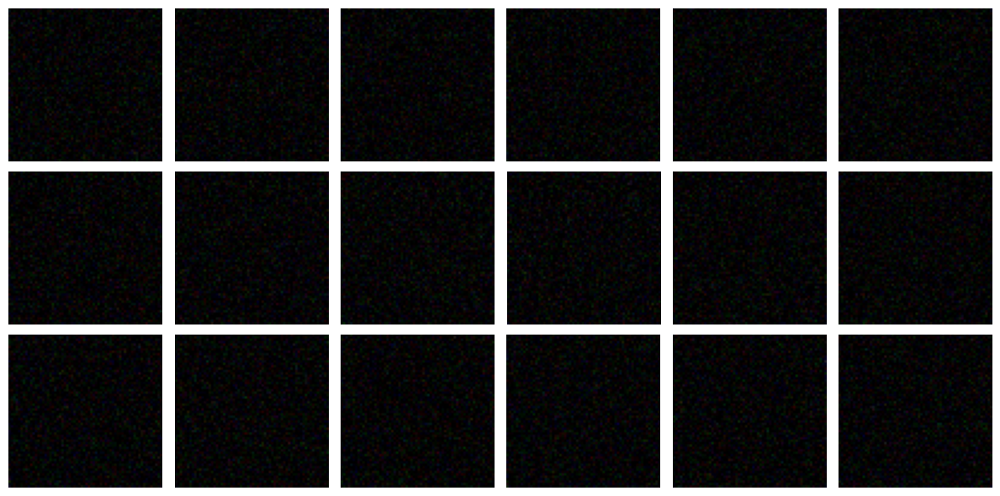

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 115ms/step - i_loss: 0.3144 - n_loss: 0.1776 - kid: 0.0000e+00 - val_i_loss: 2.7204 - val_kid: 3.1924 - val_n_loss: 0.7848
Epoch 4/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2999 - n_loss: 0.1676

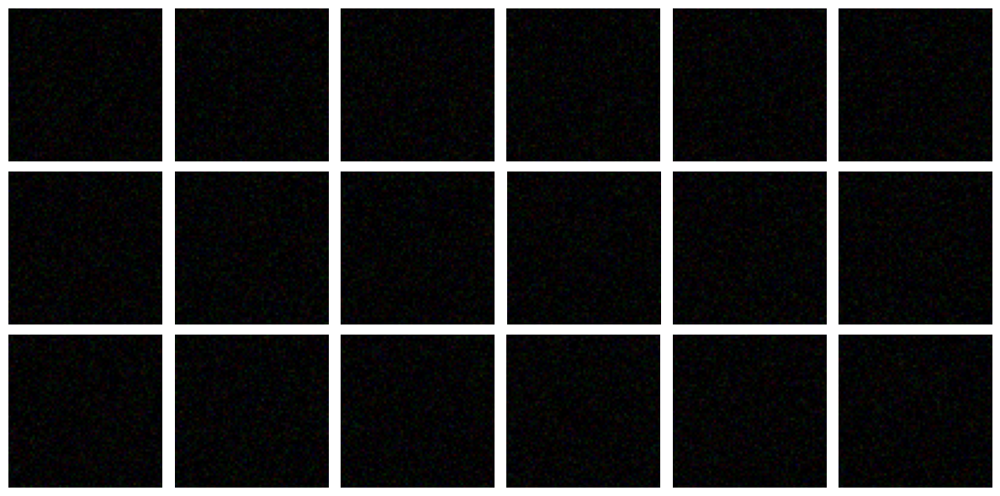

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 115ms/step - i_loss: 0.2998 - n_loss: 0.1675 - kid: 0.0000e+00 - val_i_loss: 2.3126 - val_kid: 3.0652 - val_n_loss: 0.7661
Epoch 5/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2892 - n_loss: 0.1633

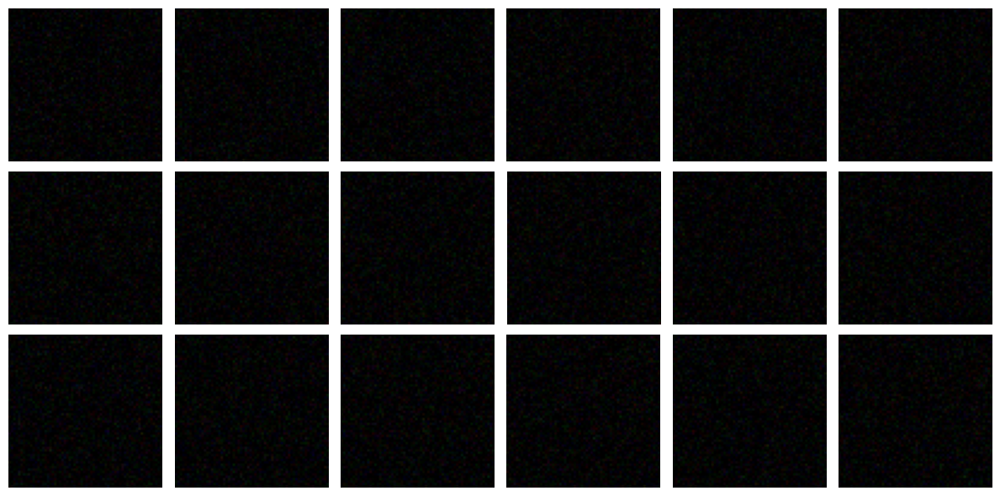

187/187 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - i_loss: 0.2892 - n_loss: 0.1633 - kid: 0.0000e+00 - val_i_loss: 2.3695 - val_kid: 2.9555 - val_n_loss: 0.7369
Epoch 6/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - i_loss: 0.2779 - n_loss: 0.1608

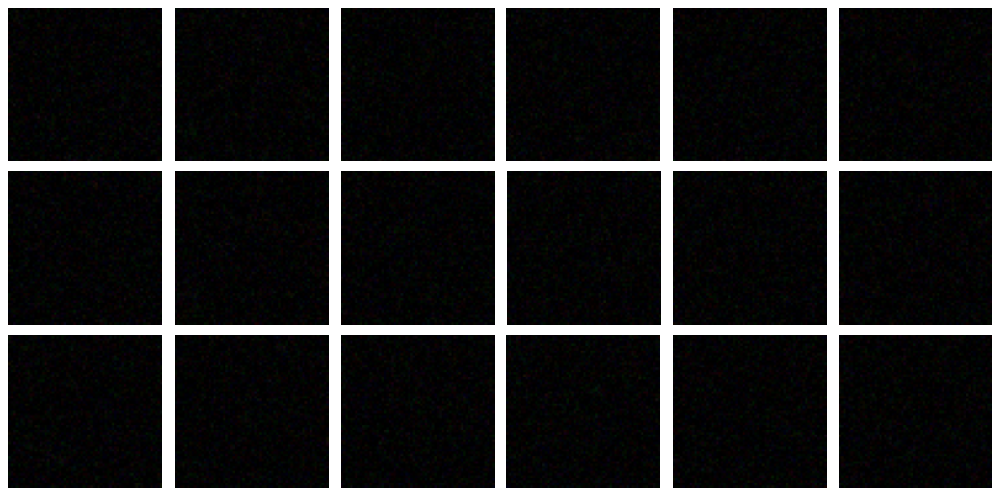

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 112ms/step - i_loss: 0.2779 - n_loss: 0.1608 - kid: 0.0000e+00 - val_i_loss: 2.0589 - val_kid: 2.7982 - val_n_loss: 0.6942
Epoch 7/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2775 - n_loss: 0.1571

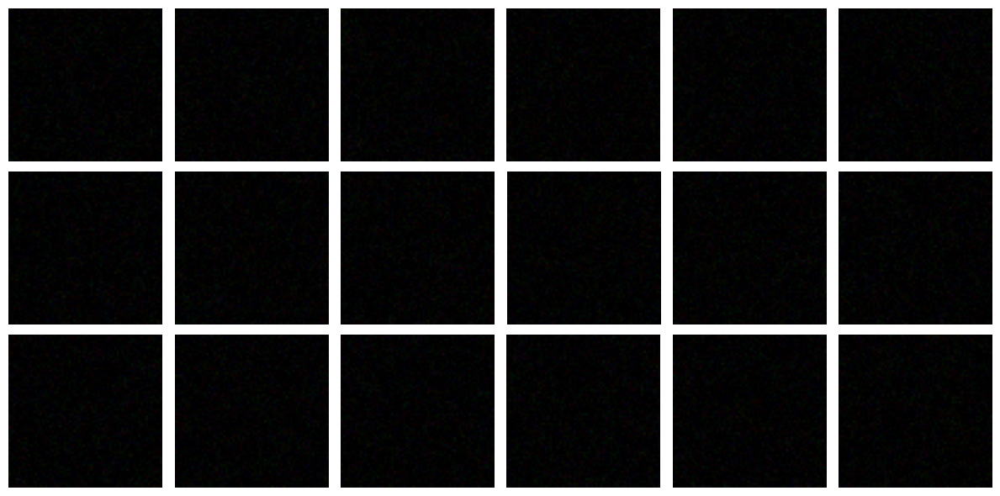

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 118ms/step - i_loss: 0.2775 - n_loss: 0.1571 - kid: 0.0000e+00 - val_i_loss: 1.6690 - val_kid: 2.6589 - val_n_loss: 0.6540
Epoch 8/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2707 - n_loss: 0.1563

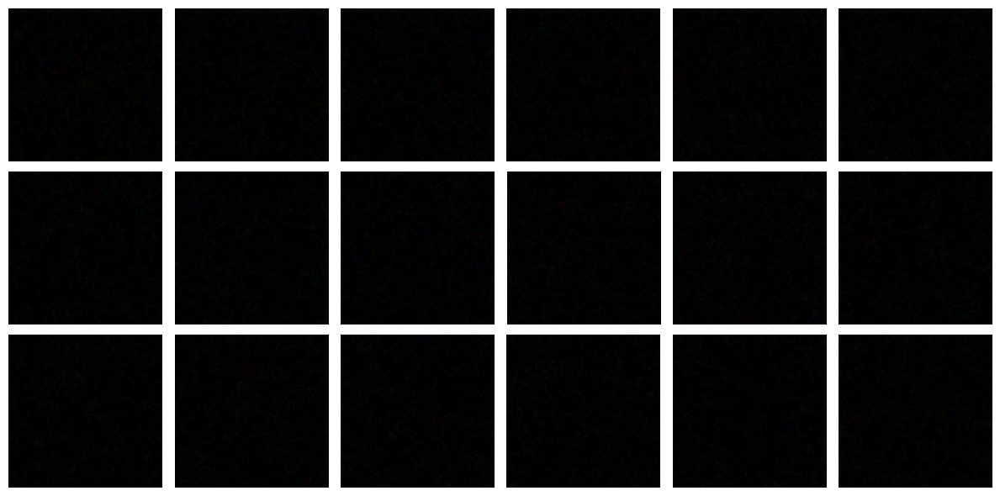

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - i_loss: 0.2707 - n_loss: 0.1563 - kid: 0.0000e+00 - val_i_loss: 1.3153 - val_kid: 2.4211 - val_n_loss: 0.5997
Epoch 9/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2612 - n_loss: 0.1527

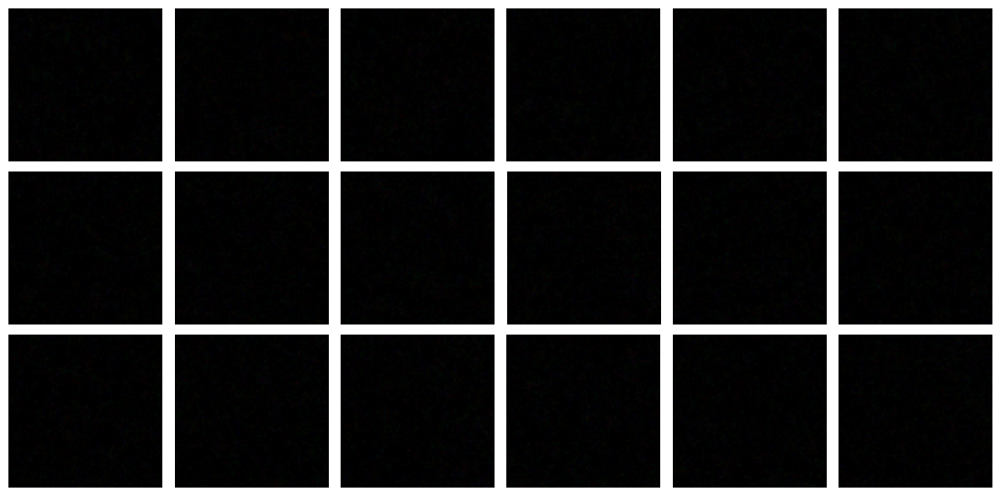

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - i_loss: 0.2612 - n_loss: 0.1527 - kid: 0.0000e+00 - val_i_loss: 1.7957 - val_kid: 2.2166 - val_n_loss: 0.5368
Epoch 10/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2611 - n_loss: 0.1489

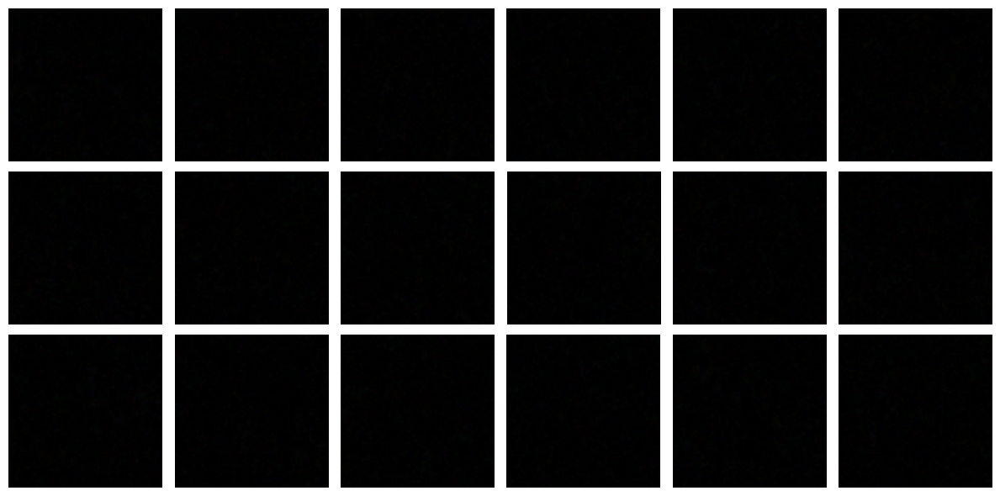

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - i_loss: 0.2611 - n_loss: 0.1490 - kid: 0.0000e+00 - val_i_loss: 1.2559 - val_kid: 2.0862 - val_n_loss: 0.4826
Epoch 11/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2619 - n_loss: 0.1496

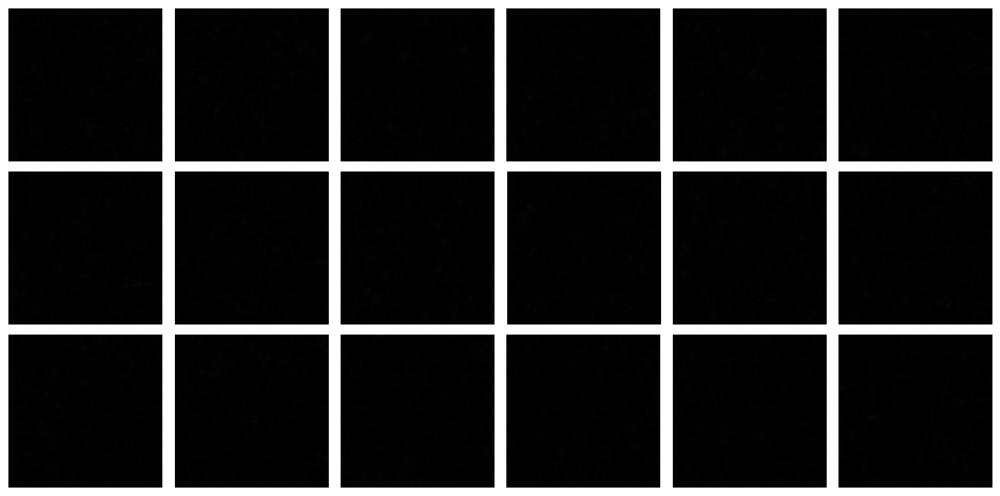

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - i_loss: 0.2619 - n_loss: 0.1496 - kid: 0.0000e+00 - val_i_loss: 1.2567 - val_kid: 2.0343 - val_n_loss: 0.4302
Epoch 12/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2555 - n_loss: 0.1504

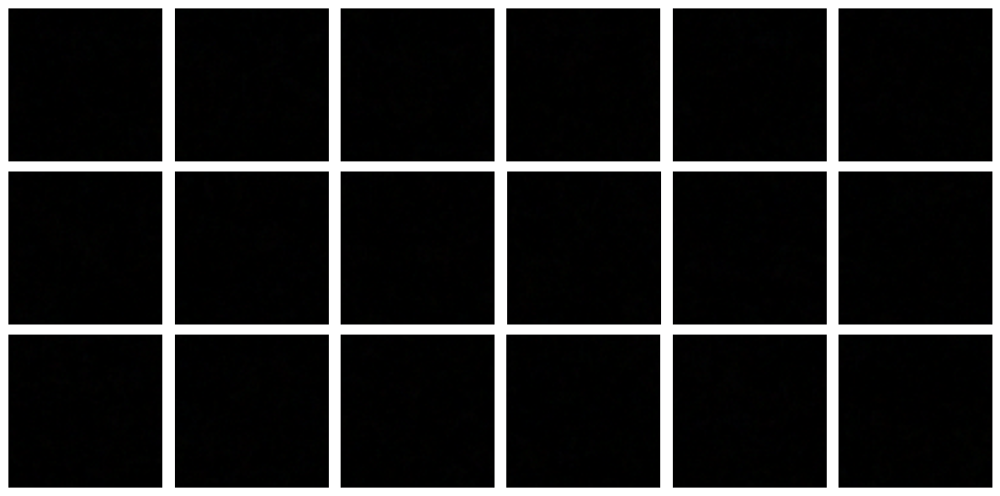

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - i_loss: 0.2554 - n_loss: 0.1504 - kid: 0.0000e+00 - val_i_loss: 1.0964 - val_kid: 1.9896 - val_n_loss: 0.3862
Epoch 13/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2498 - n_loss: 0.1486

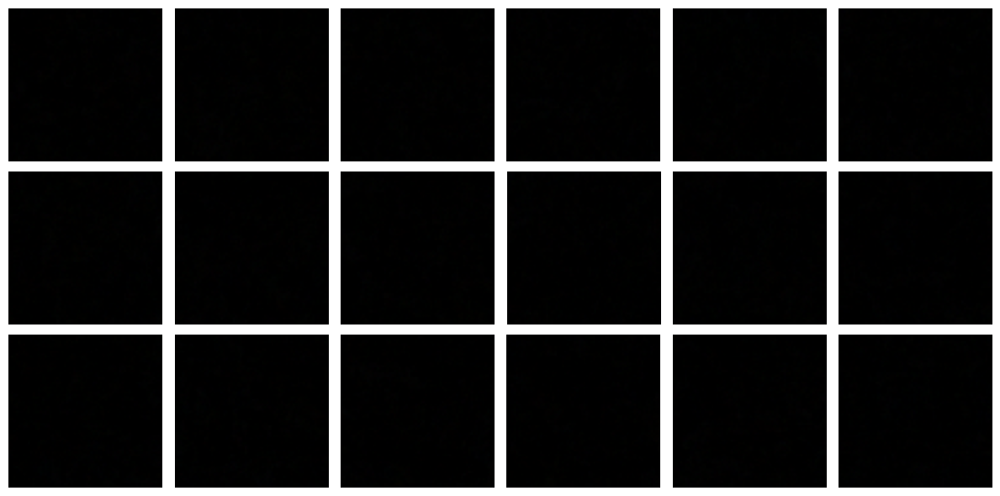

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - i_loss: 0.2498 - n_loss: 0.1486 - kid: 0.0000e+00 - val_i_loss: 0.8729 - val_kid: 1.9707 - val_n_loss: 0.3367
Epoch 14/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - i_loss: 0.2478 - n_loss: 0.1482

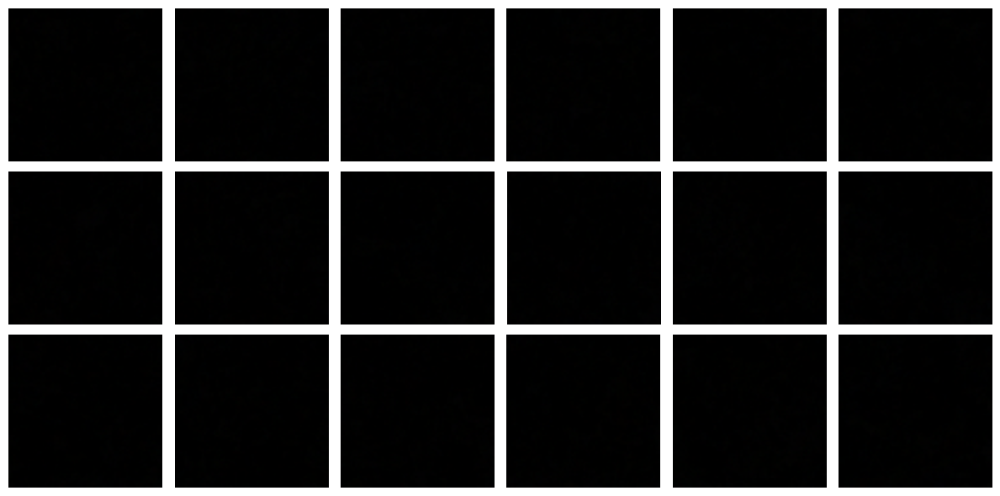

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - i_loss: 0.2478 - n_loss: 0.1482 - kid: 0.0000e+00 - val_i_loss: 0.6775 - val_kid: 1.9261 - val_n_loss: 0.3000
Epoch 15/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2471 - n_loss: 0.1464

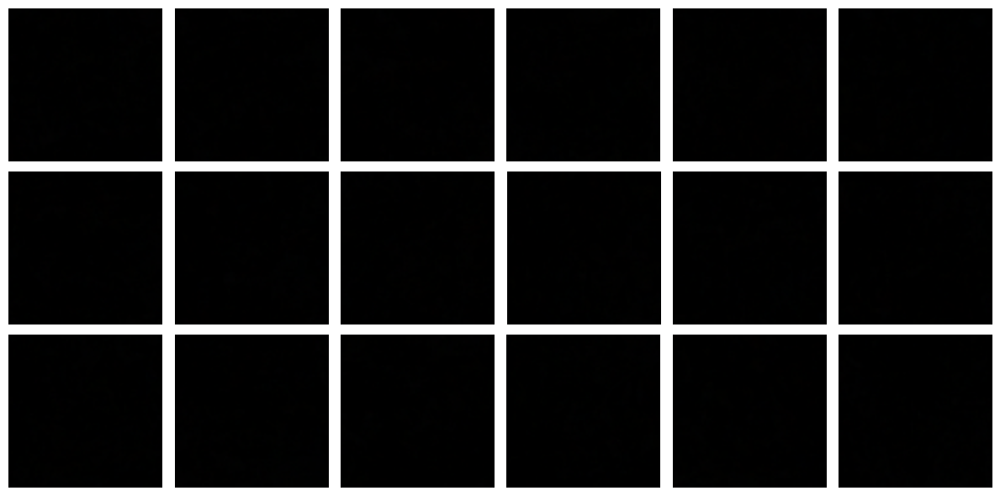

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 123ms/step - i_loss: 0.2471 - n_loss: 0.1464 - kid: 0.0000e+00 - val_i_loss: 0.7158 - val_kid: 1.8649 - val_n_loss: 0.2680
Epoch 16/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2473 - n_loss: 0.1465

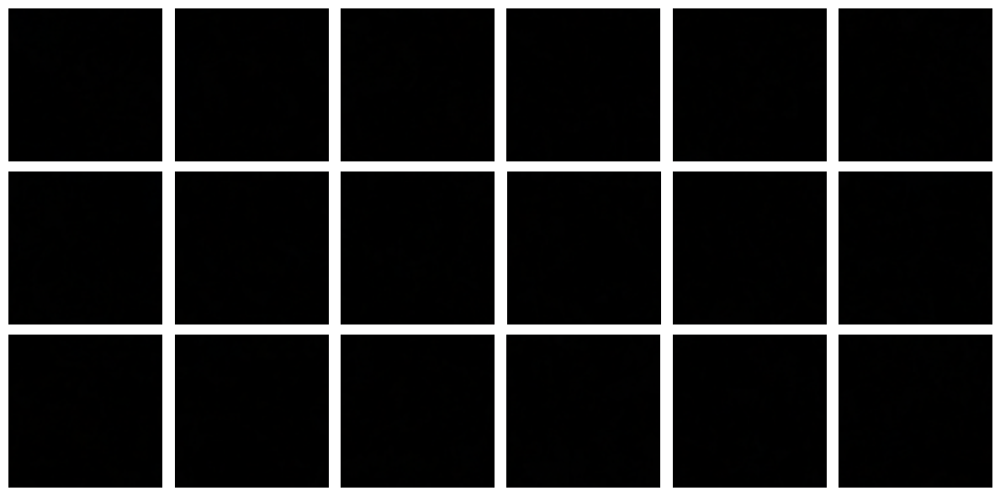

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - i_loss: 0.2473 - n_loss: 0.1465 - kid: 0.0000e+00 - val_i_loss: 0.6038 - val_kid: 1.7698 - val_n_loss: 0.2326
Epoch 17/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - i_loss: 0.2413 - n_loss: 0.1462

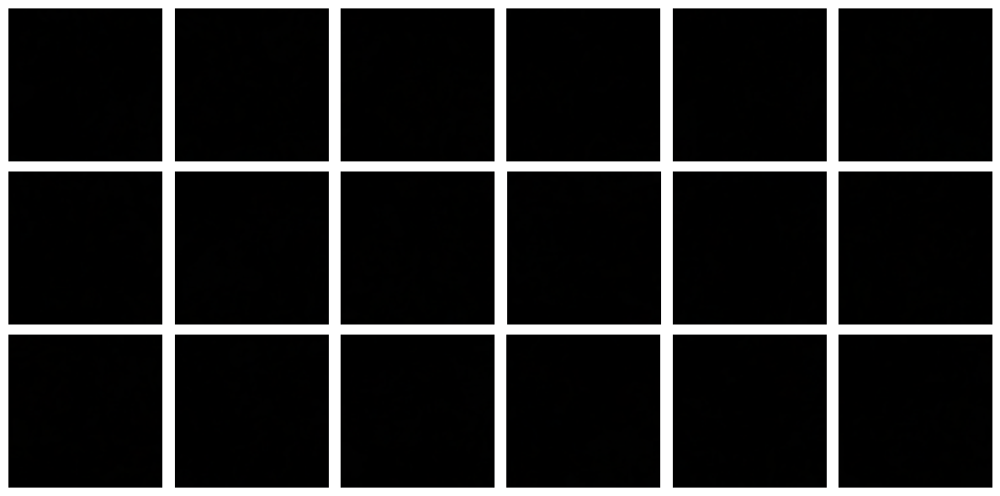

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - i_loss: 0.2414 - n_loss: 0.1462 - kid: 0.0000e+00 - val_i_loss: 0.6173 - val_kid: 1.6936 - val_n_loss: 0.2120
Epoch 18/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2466 - n_loss: 0.1444

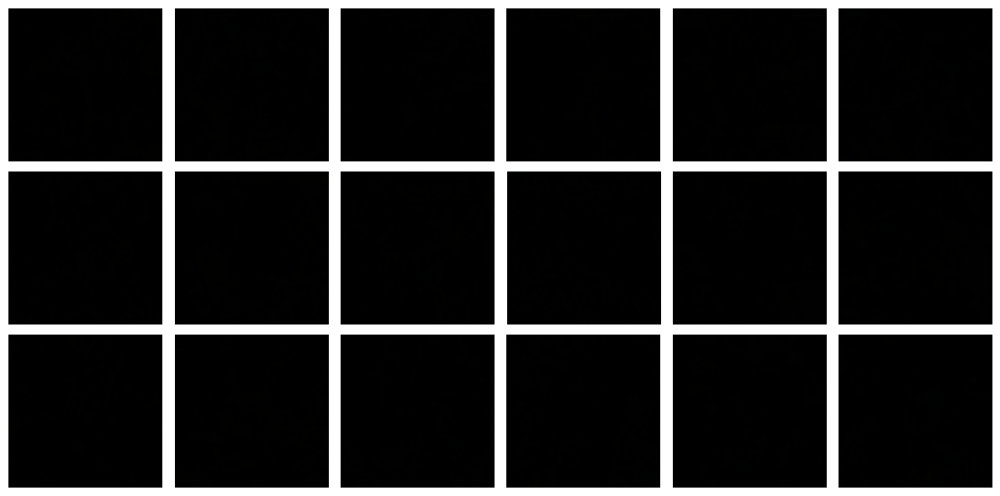

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - i_loss: 0.2466 - n_loss: 0.1444 - kid: 0.0000e+00 - val_i_loss: 0.4559 - val_kid: 1.5992 - val_n_loss: 0.1960
Epoch 19/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2433 - n_loss: 0.1438

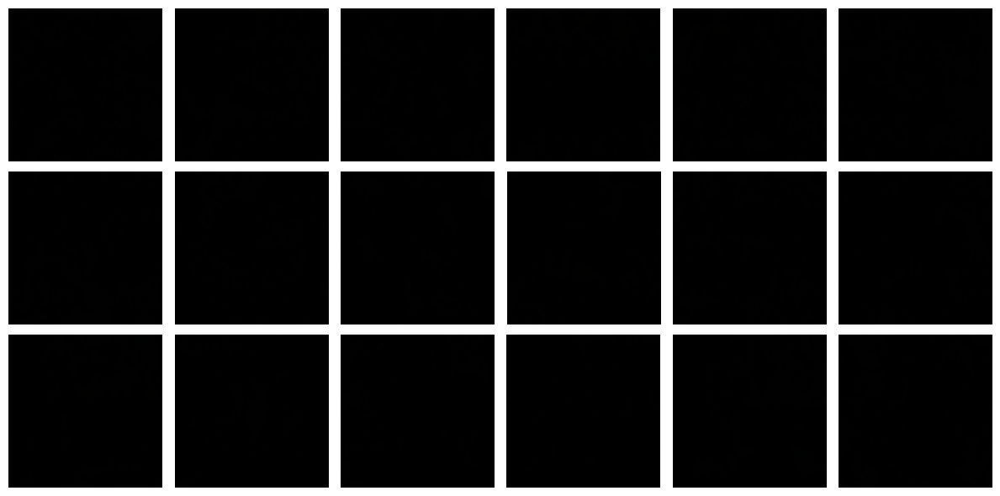

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 122ms/step - i_loss: 0.2433 - n_loss: 0.1439 - kid: 0.0000e+00 - val_i_loss: 0.3968 - val_kid: 1.5432 - val_n_loss: 0.1752
Epoch 20/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2437 - n_loss: 0.1426

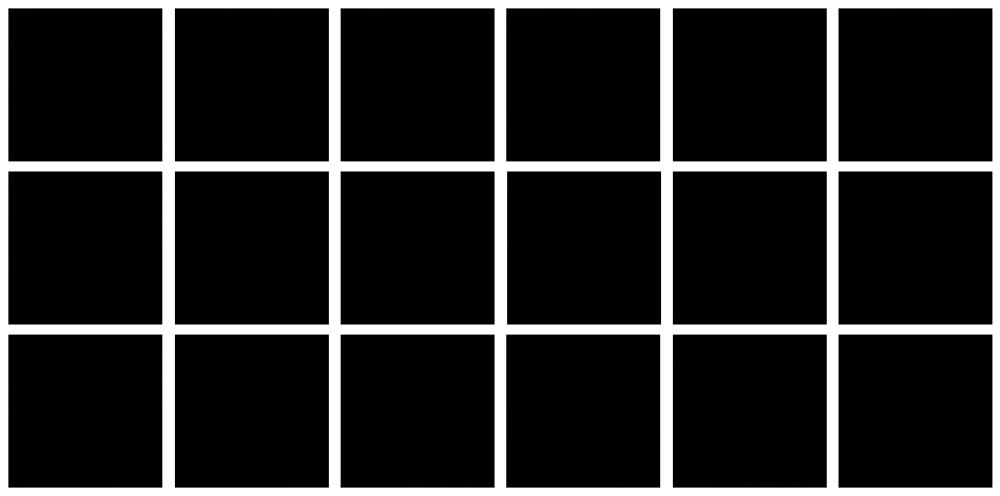

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - i_loss: 0.2437 - n_loss: 0.1426 - kid: 0.0000e+00 - val_i_loss: 0.3422 - val_kid: 1.4065 - val_n_loss: 0.1621
Epoch 21/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2366 - n_loss: 0.1437

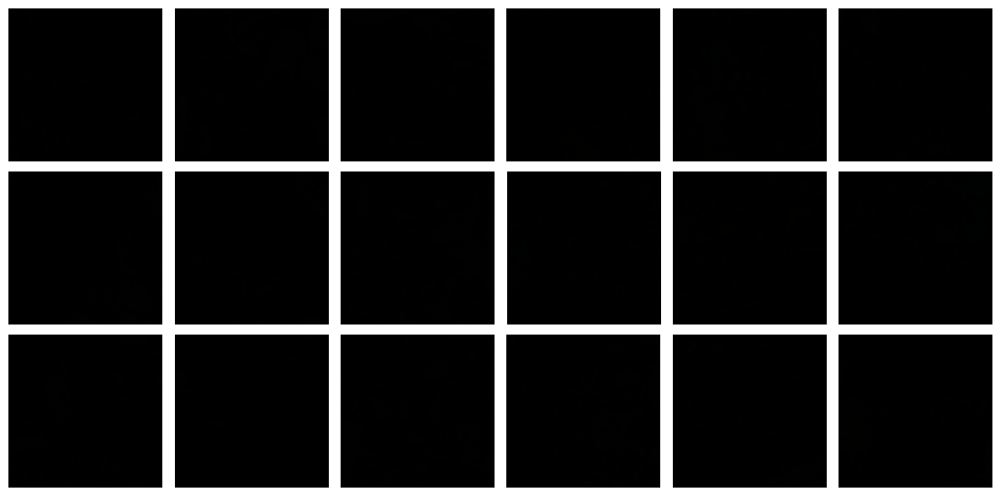

187/187 ━━━━━━━━━━━━━━━━━━━━ 40s 118ms/step - i_loss: 0.2366 - n_loss: 0.1437 - kid: 0.0000e+00 - val_i_loss: 0.3595 - val_kid: 1.2330 - val_n_loss: 0.1553
Epoch 22/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2418 - n_loss: 0.1436

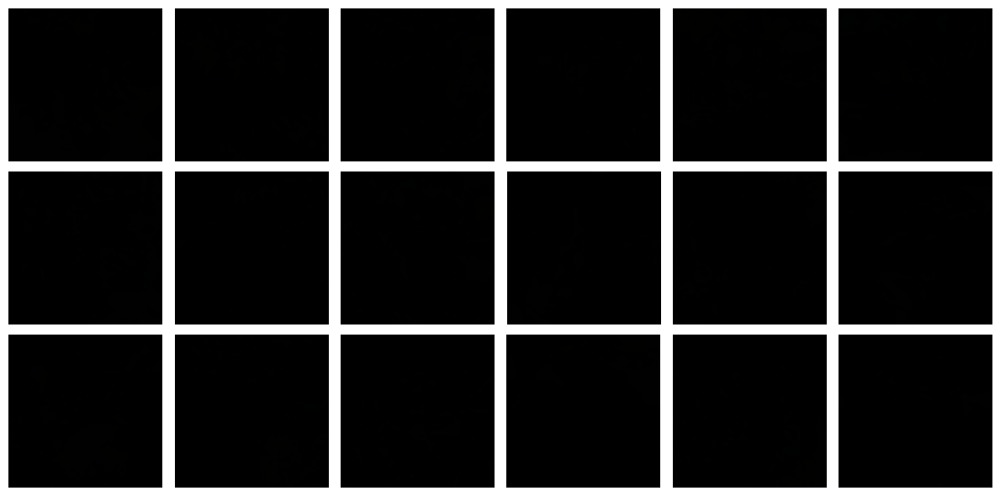

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - i_loss: 0.2418 - n_loss: 0.1436 - kid: 0.0000e+00 - val_i_loss: 0.3057 - val_kid: 1.1418 - val_n_loss: 0.1472
Epoch 23/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2393 - n_loss: 0.1428

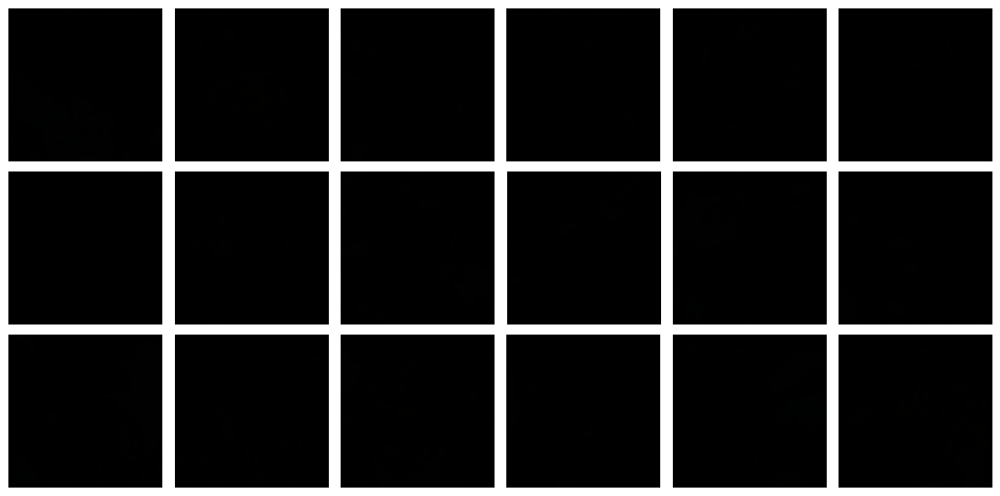

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - i_loss: 0.2393 - n_loss: 0.1428 - kid: 0.0000e+00 - val_i_loss: 0.2888 - val_kid: 1.0418 - val_n_loss: 0.1401
Epoch 24/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2361 - n_loss: 0.1418

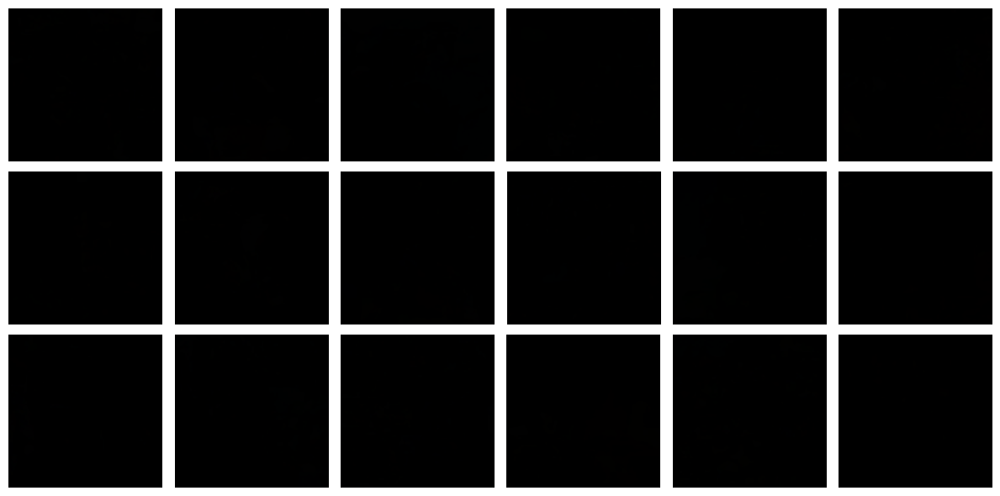

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 118ms/step - i_loss: 0.2361 - n_loss: 0.1418 - kid: 0.0000e+00 - val_i_loss: 0.2409 - val_kid: 0.8891 - val_n_loss: 0.1326
Epoch 25/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2418 - n_loss: 0.1391

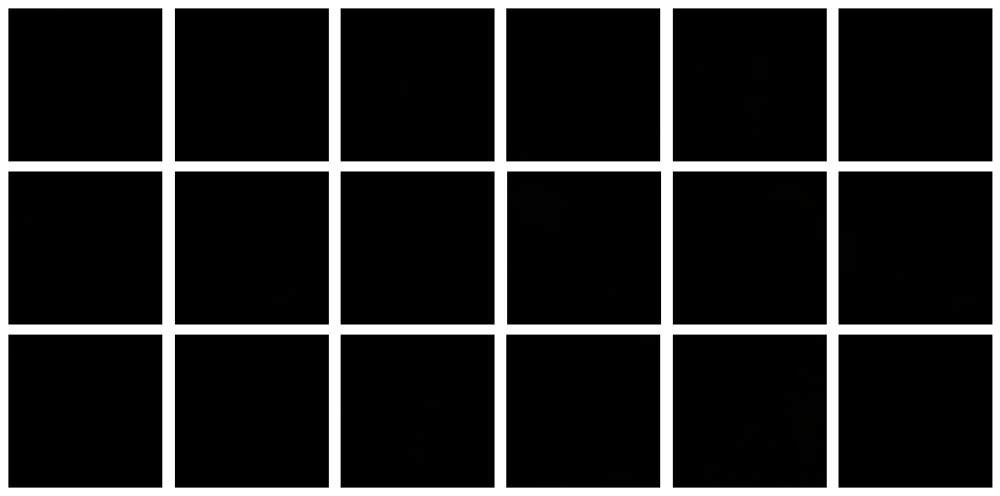

187/187 ━━━━━━━━━━━━━━━━━━━━ 42s 121ms/step - i_loss: 0.2418 - n_loss: 0.1391 - kid: 0.0000e+00 - val_i_loss: 0.2226 - val_kid: 0.7751 - val_n_loss: 0.1321
Epoch 26/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2403 - n_loss: 0.1406

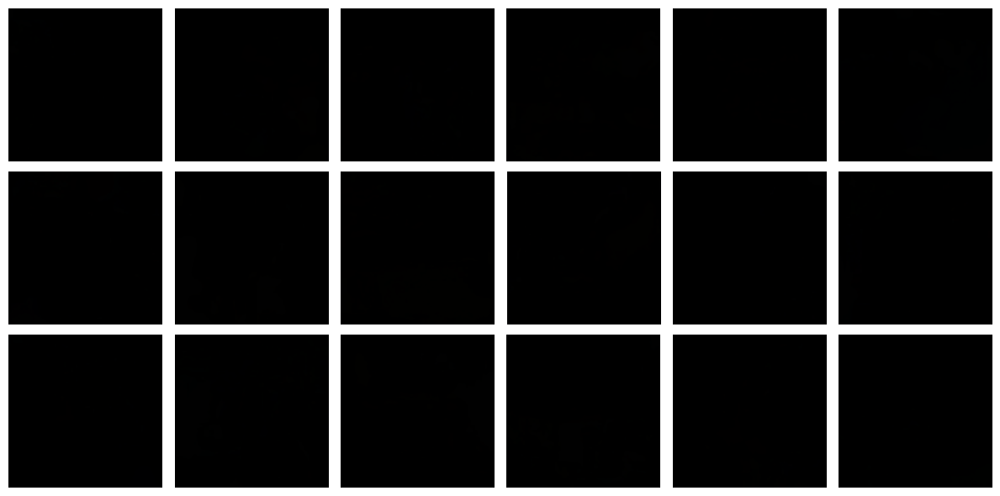

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 123ms/step - i_loss: 0.2403 - n_loss: 0.1406 - kid: 0.0000e+00 - val_i_loss: 0.2022 - val_kid: 0.6313 - val_n_loss: 0.1317
Epoch 27/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - i_loss: 0.2439 - n_loss: 0.1413

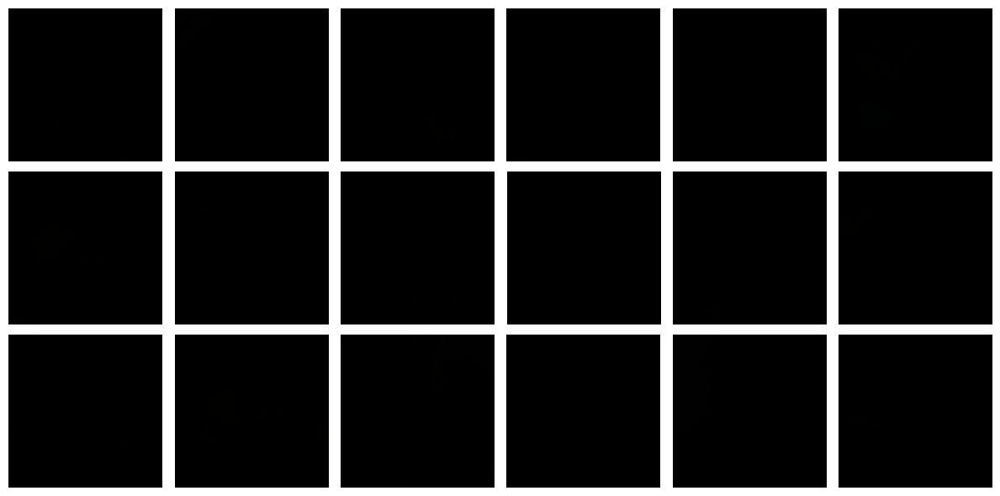

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - i_loss: 0.2439 - n_loss: 0.1413 - kid: 0.0000e+00 - val_i_loss: 0.2019 - val_kid: 0.5090 - val_n_loss: 0.1268
Epoch 28/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2353 - n_loss: 0.1409

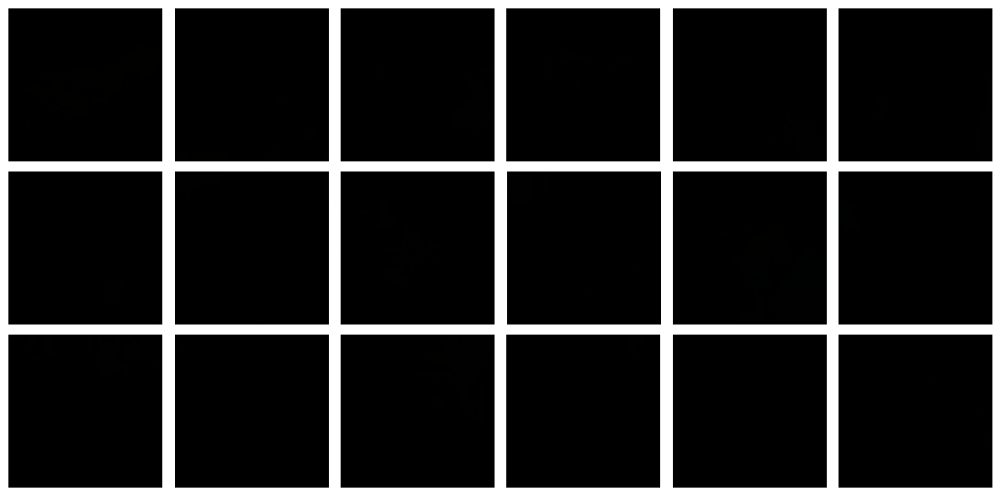

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - i_loss: 0.2353 - n_loss: 0.1409 - kid: 0.0000e+00 - val_i_loss: 0.2188 - val_kid: 0.3978 - val_n_loss: 0.1201
Epoch 29/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2311 - n_loss: 0.1408

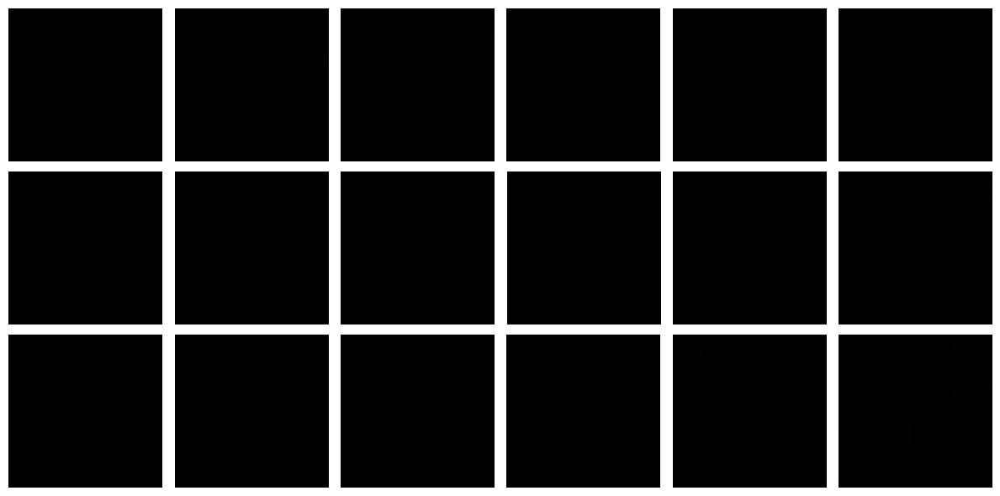

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - i_loss: 0.2311 - n_loss: 0.1408 - kid: 0.0000e+00 - val_i_loss: 0.1867 - val_kid: 0.2482 - val_n_loss: 0.1277
Epoch 30/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2345 - n_loss: 0.1404

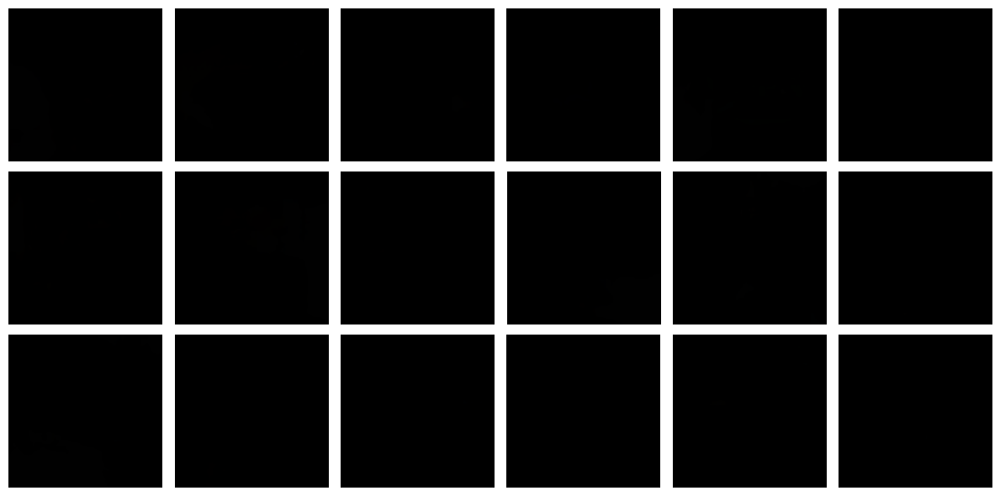

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - i_loss: 0.2345 - n_loss: 0.1404 - kid: 0.0000e+00 - val_i_loss: 0.1892 - val_kid: 0.1709 - val_n_loss: 0.1266
Epoch 31/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2337 - n_loss: 0.1400

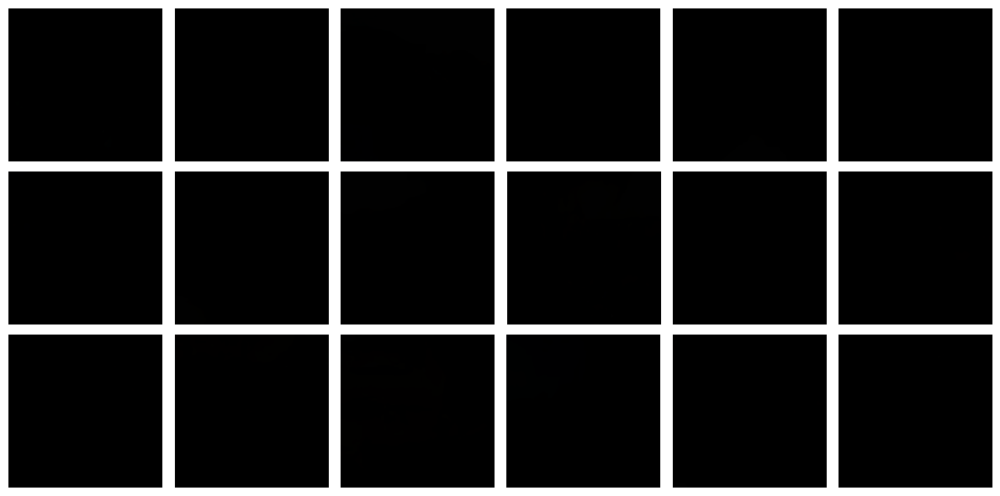

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - i_loss: 0.2337 - n_loss: 0.1400 - kid: 0.0000e+00 - val_i_loss: 0.1718 - val_kid: 0.1071 - val_n_loss: 0.1390
Epoch 32/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2298 - n_loss: 0.1398

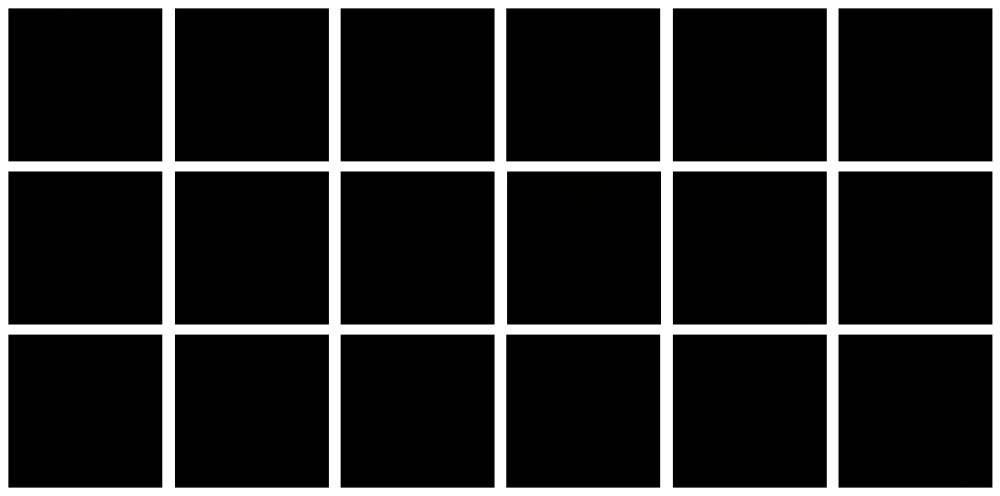

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 124ms/step - i_loss: 0.2298 - n_loss: 0.1398 - kid: 0.0000e+00 - val_i_loss: 0.1995 - val_kid: 0.0762 - val_n_loss: 0.1178
Epoch 33/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - i_loss: 0.2393 - n_loss: 0.1385

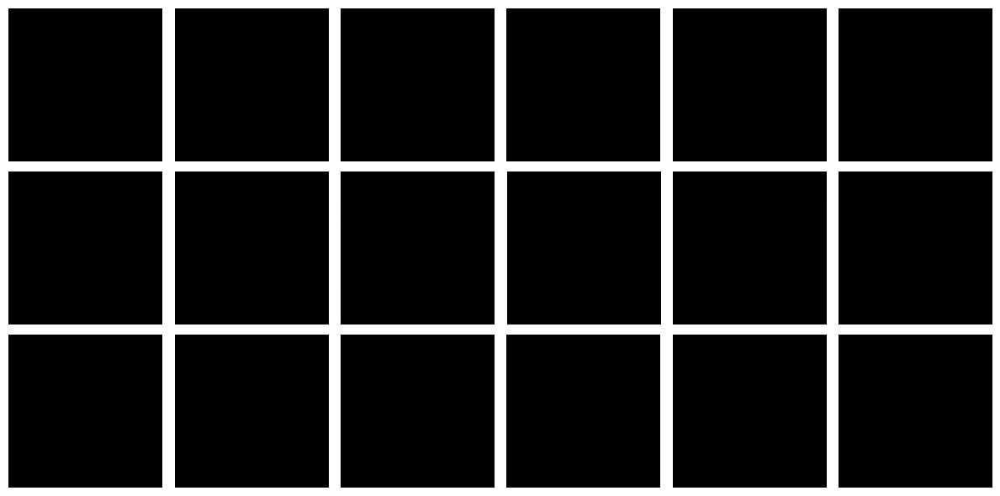

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - i_loss: 0.2393 - n_loss: 0.1385 - kid: 0.0000e+00 - val_i_loss: 0.1884 - val_kid: 0.0651 - val_n_loss: 0.1200
Epoch 34/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2311 - n_loss: 0.1394

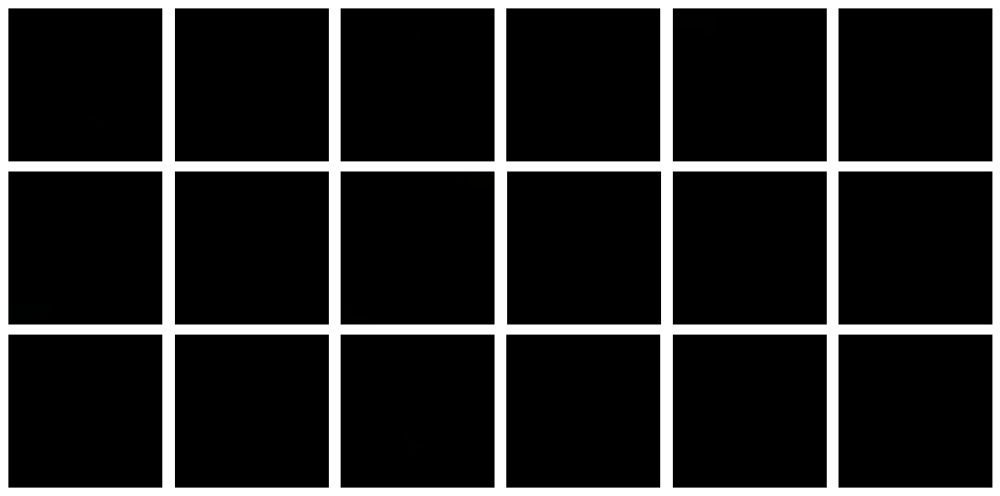

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - i_loss: 0.2311 - n_loss: 0.1394 - kid: 0.0000e+00 - val_i_loss: 0.1860 - val_kid: 0.0483 - val_n_loss: 0.1230
Epoch 35/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2306 - n_loss: 0.1381

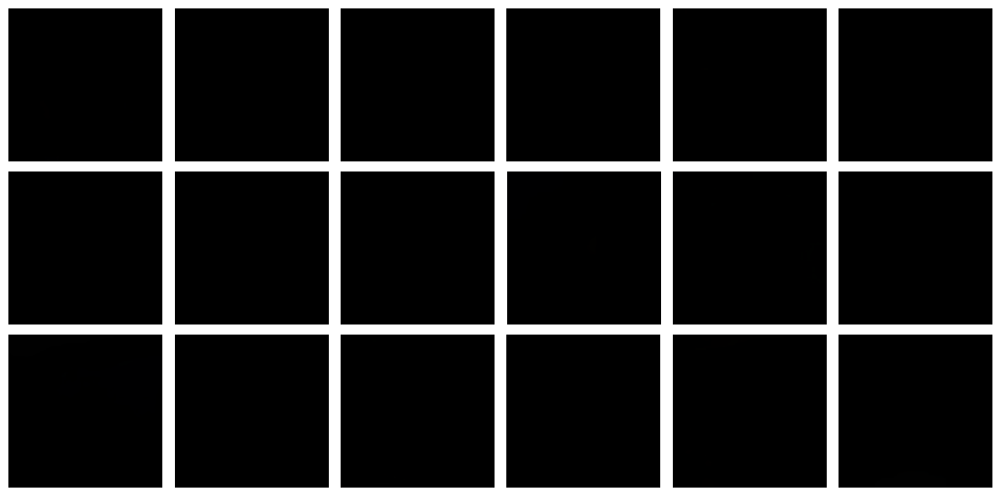

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 120ms/step - i_loss: 0.2306 - n_loss: 0.1381 - kid: 0.0000e+00 - val_i_loss: 0.1799 - val_kid: 0.0376 - val_n_loss: 0.1249
Epoch 36/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2306 - n_loss: 0.1392

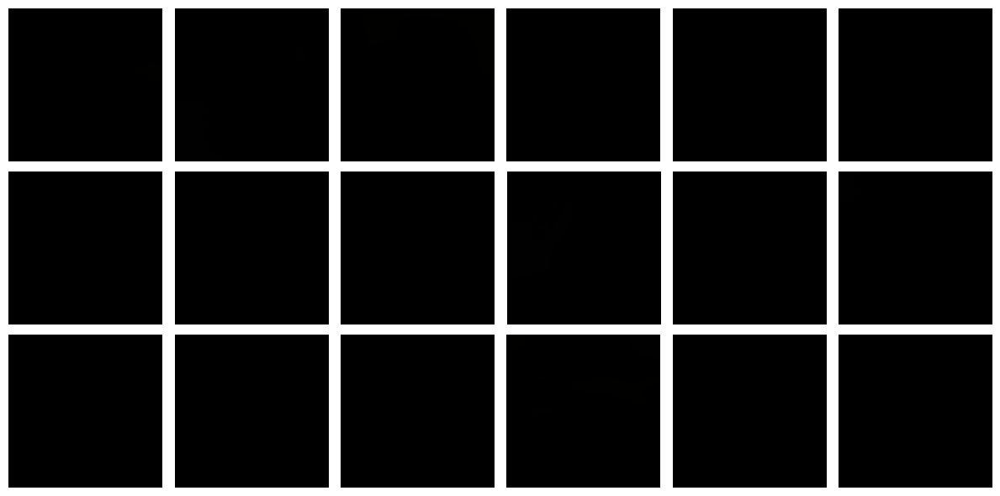

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 121ms/step - i_loss: 0.2306 - n_loss: 0.1392 - kid: 0.0000e+00 - val_i_loss: 0.1918 - val_kid: 0.0339 - val_n_loss: 0.1225
Epoch 37/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2354 - n_loss: 0.1378

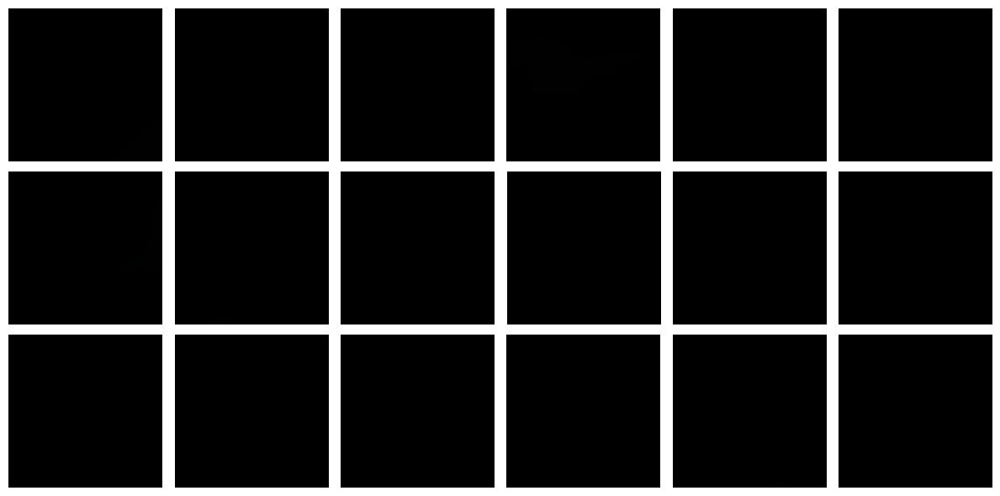

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - i_loss: 0.2354 - n_loss: 0.1378 - kid: 0.0000e+00 - val_i_loss: 0.1857 - val_kid: 0.0287 - val_n_loss: 0.1293
Epoch 38/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2285 - n_loss: 0.1398

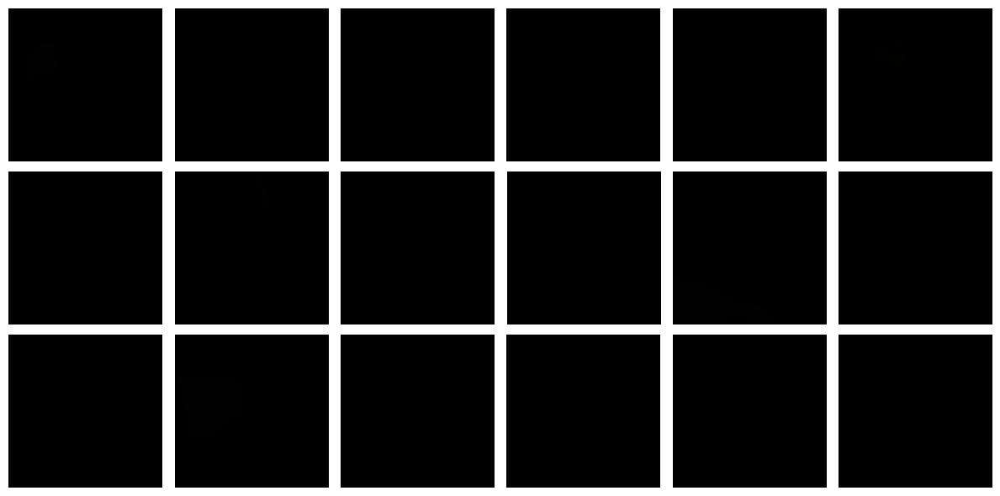

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 116ms/step - i_loss: 0.2285 - n_loss: 0.1398 - kid: 0.0000e+00 - val_i_loss: 0.1759 - val_kid: 0.0293 - val_n_loss: 0.1261
Epoch 39/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2302 - n_loss: 0.1376

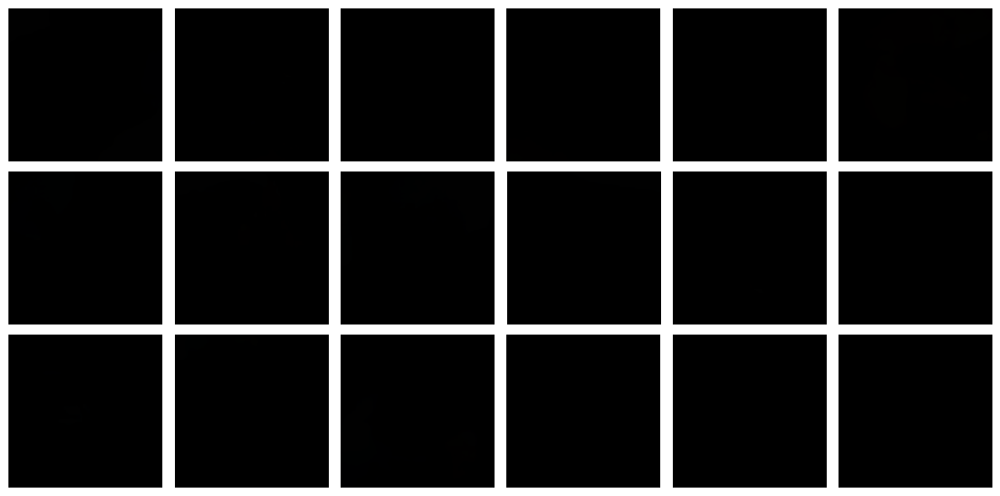

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - i_loss: 0.2302 - n_loss: 0.1376 - kid: 0.0000e+00 - val_i_loss: 0.1900 - val_kid: 0.0253 - val_n_loss: 0.1148
Epoch 40/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2346 - n_loss: 0.1349

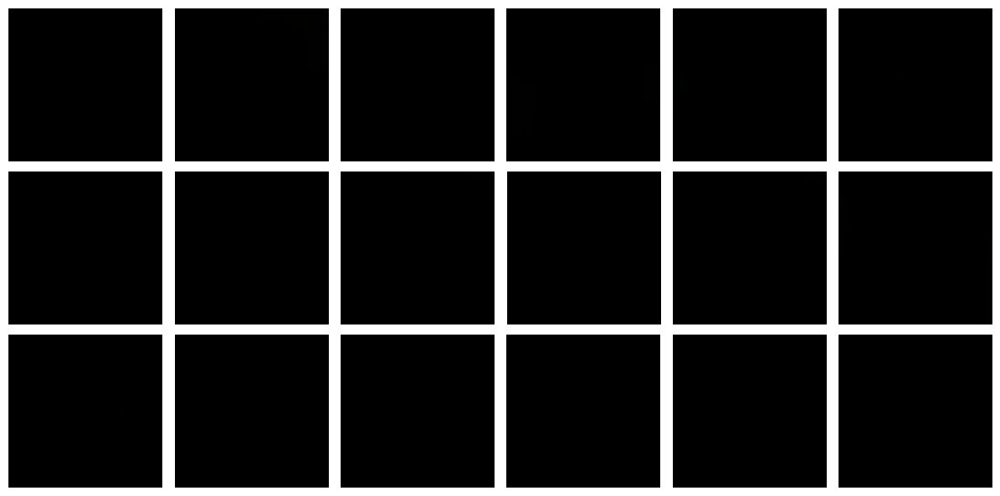

187/187 ━━━━━━━━━━━━━━━━━━━━ 22s 119ms/step - i_loss: 0.2346 - n_loss: 0.1349 - kid: 0.0000e+00 - val_i_loss: 0.1845 - val_kid: 0.0210 - val_n_loss: 0.1199
Epoch 41/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2312 - n_loss: 0.1362

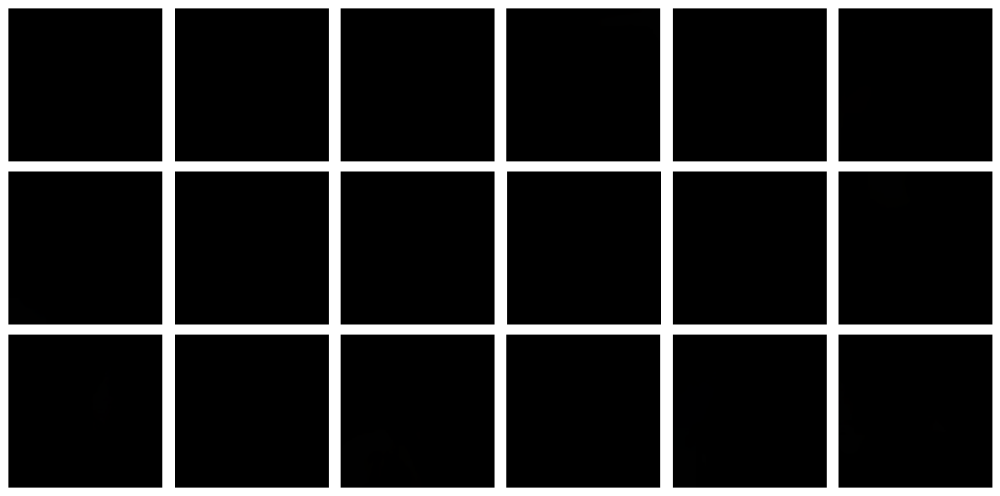

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 122ms/step - i_loss: 0.2312 - n_loss: 0.1362 - kid: 0.0000e+00 - val_i_loss: 0.1965 - val_kid: 0.0183 - val_n_loss: 0.1157
Epoch 42/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2335 - n_loss: 0.1364

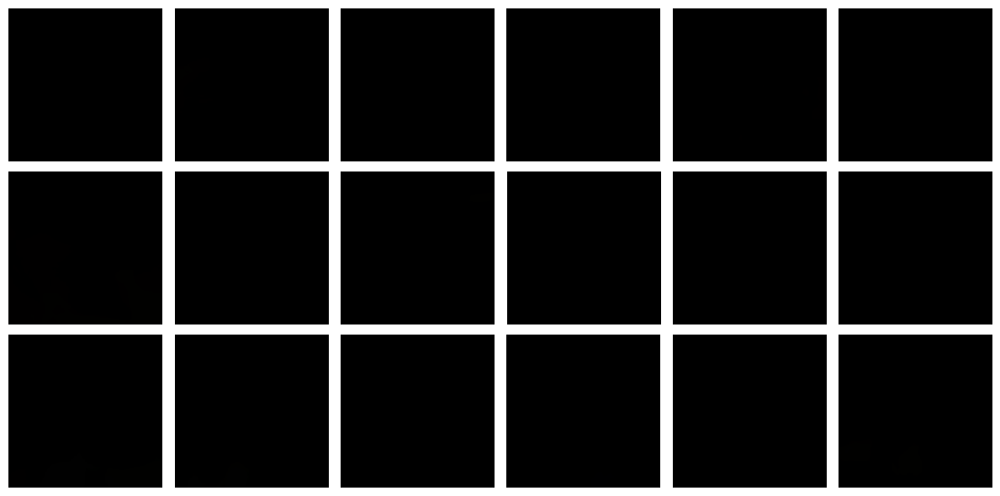

187/187 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - i_loss: 0.2335 - n_loss: 0.1364 - kid: 0.0000e+00 - val_i_loss: 0.1982 - val_kid: 0.0176 - val_n_loss: 0.1122
Epoch 43/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2290 - n_loss: 0.1363

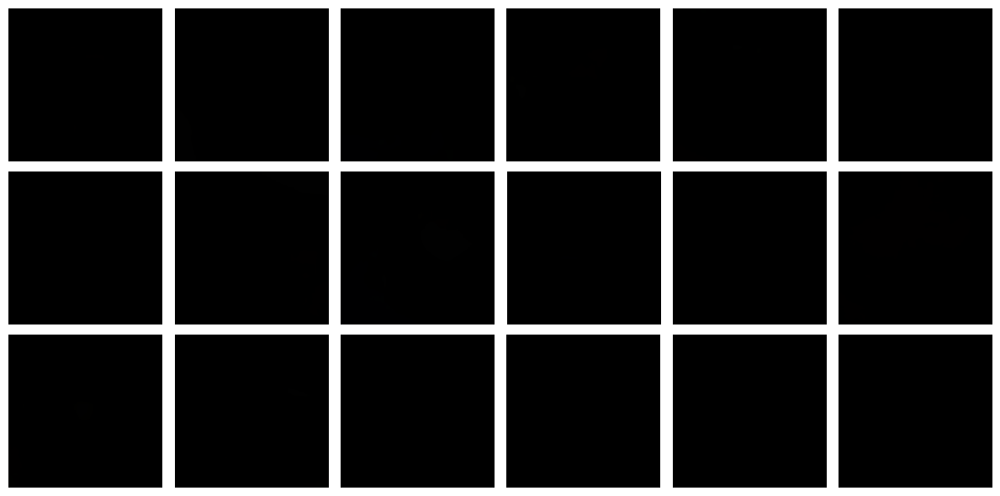

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 119ms/step - i_loss: 0.2290 - n_loss: 0.1363 - kid: 0.0000e+00 - val_i_loss: 0.1915 - val_kid: 0.0164 - val_n_loss: 0.1201
Epoch 44/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2255 - n_loss: 0.1361

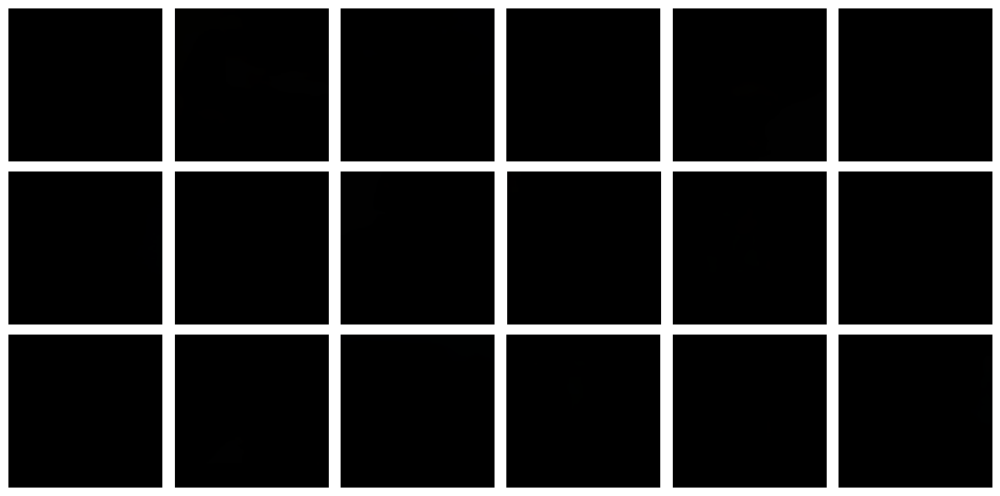

187/187 ━━━━━━━━━━━━━━━━━━━━ 40s 115ms/step - i_loss: 0.2256 - n_loss: 0.1361 - kid: 0.0000e+00 - val_i_loss: 0.1832 - val_kid: 0.0164 - val_n_loss: 0.1206
Epoch 45/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2277 - n_loss: 0.1376

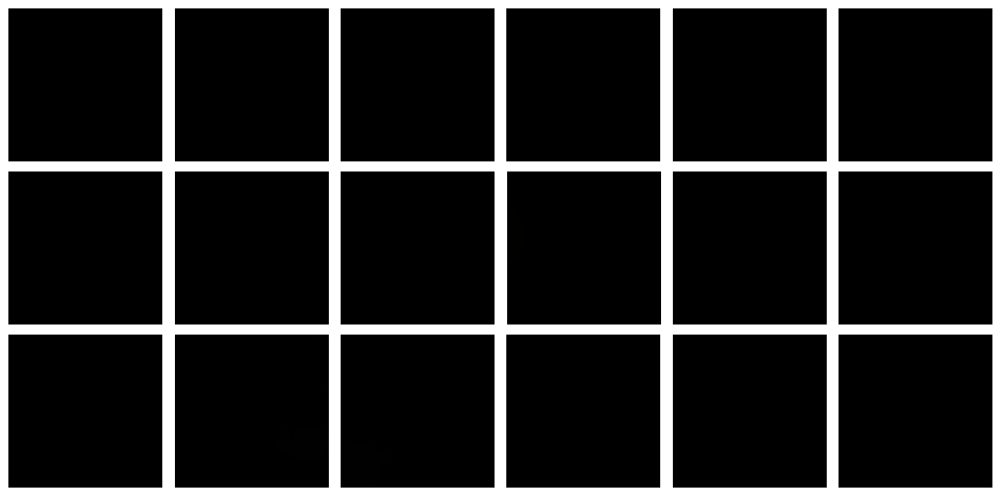

187/187 ━━━━━━━━━━━━━━━━━━━━ 42s 119ms/step - i_loss: 0.2277 - n_loss: 0.1376 - kid: 0.0000e+00 - val_i_loss: 0.1819 - val_kid: 0.0111 - val_n_loss: 0.1221
Epoch 46/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2283 - n_loss: 0.1356

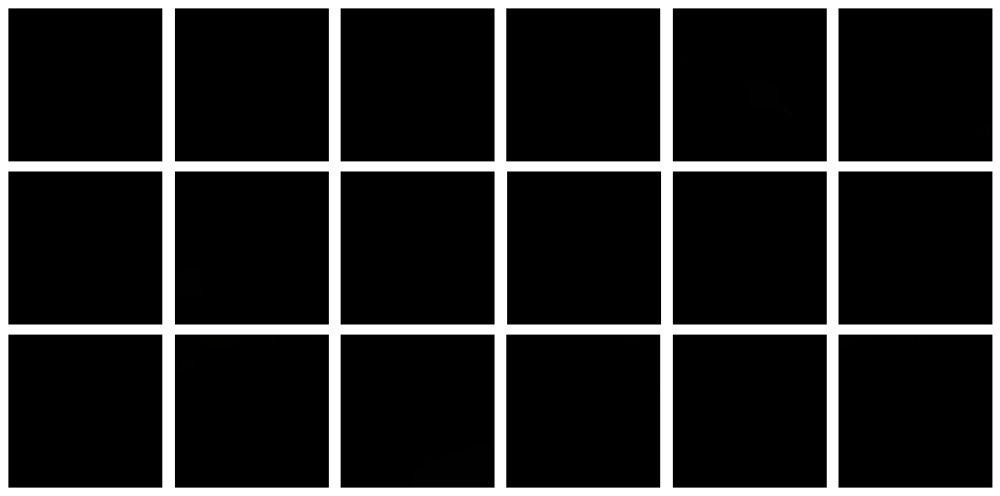

187/187 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - i_loss: 0.2283 - n_loss: 0.1356 - kid: 0.0000e+00 - val_i_loss: 0.1807 - val_kid: 0.0170 - val_n_loss: 0.1245
Epoch 47/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2247 - n_loss: 0.1372

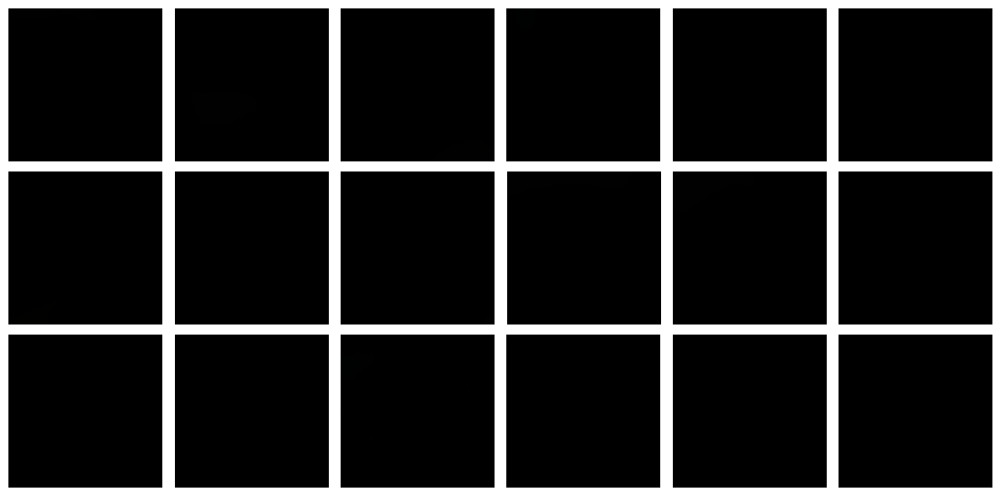

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 114ms/step - i_loss: 0.2247 - n_loss: 0.1372 - kid: 0.0000e+00 - val_i_loss: 0.1743 - val_kid: 0.0158 - val_n_loss: 0.1244
Epoch 48/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - i_loss: 0.2295 - n_loss: 0.1341

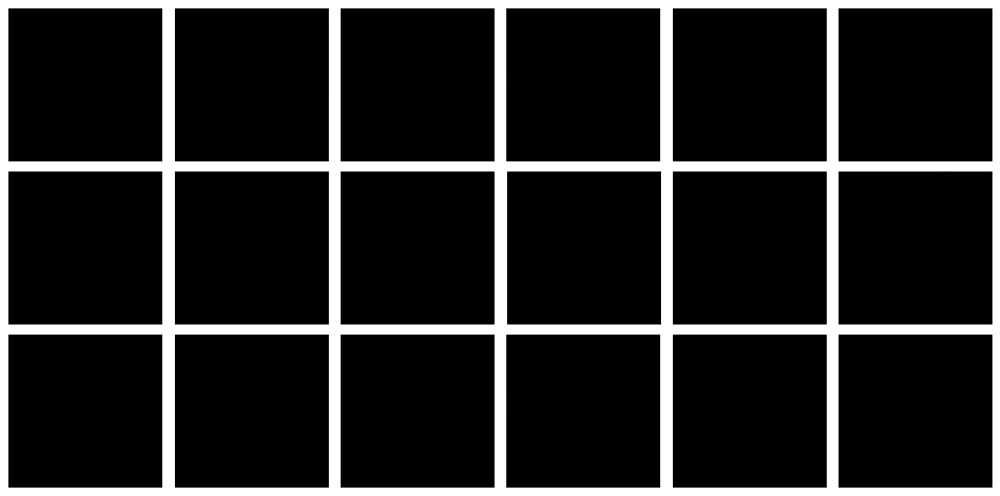

187/187 ━━━━━━━━━━━━━━━━━━━━ 21s 113ms/step - i_loss: 0.2295 - n_loss: 0.1341 - kid: 0.0000e+00 - val_i_loss: 0.1895 - val_kid: 0.0139 - val_n_loss: 0.1196
Epoch 49/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - i_loss: 0.2248 - n_loss: 0.1354

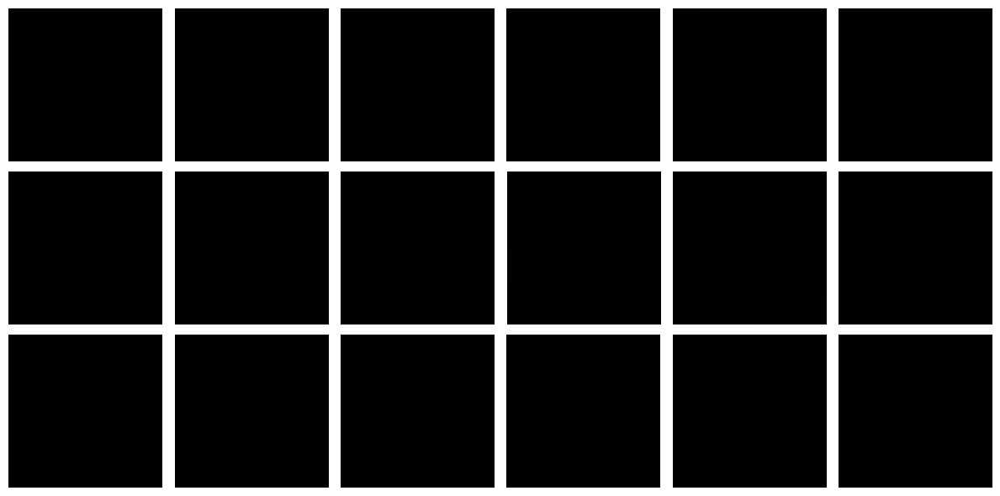

187/187 ━━━━━━━━━━━━━━━━━━━━ 21s 114ms/step - i_loss: 0.2249 - n_loss: 0.1354 - kid: 0.0000e+00 - val_i_loss: 0.1848 - val_kid: 0.0118 - val_n_loss: 0.1206
Epoch 50/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - i_loss: 0.2279 - n_loss: 0.1343

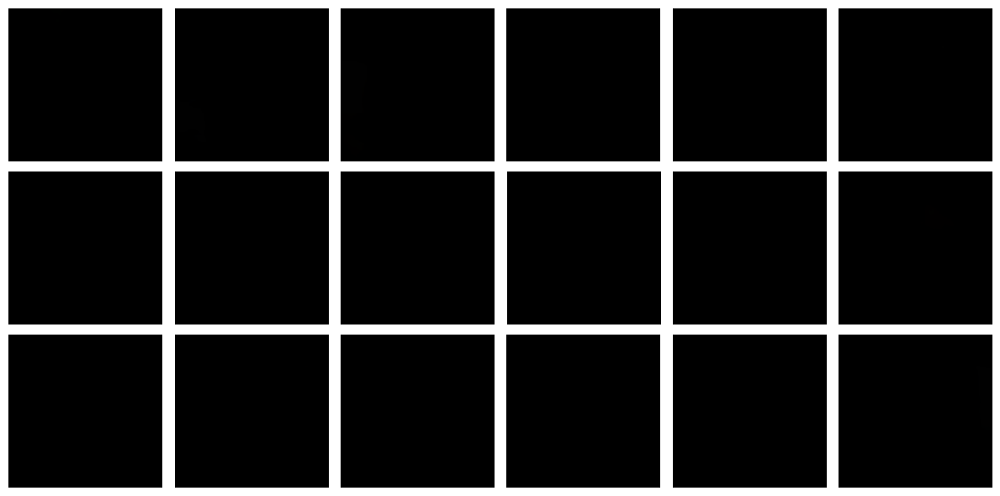

187/187 ━━━━━━━━━━━━━━━━━━━━ 41s 116ms/step - i_loss: 0.2279 - n_loss: 0.1343 - kid: 0.0000e+00 - val_i_loss: 0.1810 - val_kid: 0.0128 - val_n_loss: 0.1208


In [33]:
# run training and plot generated images periodically
model.fit(
    train_dataset,
    epochs=num_epochs,
    validation_data=test_dataset,
    callbacks=[
        keras.callbacks.LambdaCallback(on_epoch_end=model.plot_images),
        checkpoint_callback,
    ],
)